# EM local bond markets scorecard

## Get packages and JPMaQS data

### Set up parameters and import packages

In [1]:
# Constants and credentials
import os
import pandas as pd

REQUIRED_VERSION: str = "1.4.0"
DQ_CLIENT_ID: str = os.getenv("DQ_CLIENT_ID")  # Use your DataQuery ID if it is not an environment variable
DQ_CLIENT_SECRET: str = os.getenv("DQ_CLIENT_SECRET") # Use your DataQuery secret if it is not an environment variable
PROXY = {}  # Configure if behind corporate firewall
START_DATE: str = "2000-01-01"  # Start date for data download
END_DATE: str = (pd.Timestamp.today() - pd.offsets.BDay(1)).strftime('%Y-%m-%d')

In [2]:
import macrosynergy as msy

msy.check_package_version(required_version=REQUIRED_VERSION)
# If version check fails: pip install macrosynergy --upgrade

In [3]:

from datetime import date, datetime
import os

import macrosynergy.management as msm
import macrosynergy.panel as msp
import macrosynergy.pnl as msn
import macrosynergy.visuals as msv
import macrosynergy.signal as mss

from macrosynergy.download import JPMaQSDownload
from macrosynergy.visuals import ScoreVisualisers

pd.set_option('display.width', 400)
import warnings

warnings.simplefilter("ignore")

### Download quantamental indicators

In [4]:
# Cross-sections of interest

cids_latm = ["BRL", "COP", "CLP", "MXN", "PEN"]  # Latam countries
cids_emea = ["CZK", "HUF", "PLN", "RON", "RUB", "TRY", "ZAR"]  # EMEA countries, "ILS" not included
cids_emas = ["IDR", "MYR", "PHP", "THB"]  # EM Asia countries "CNY", "INR", "KRW", "SGD", "TWD"

cids_em = sorted(cids_latm + cids_emea + cids_emas)

cids = sorted(cids_em + ["USD"]) 


In [5]:
# Quantamental category groups

# External ratio trends
xbch = [
    "MTBGDPRATIO_NSA_12MMA_D1M1ML3",
    "MTBGDPRATIO_SA_6MMA_D1M1ML6",
    "MTBGDPRATIO_SA_3MMAv60MMA",
    "CABGDPRATIO_SA_3MMAv60MMA",
    "CABGDPRATIO_SA_1QMAv20QMA",
]

# Intuitive GDP growth estimates
igdp = [
    "INTRGDP_NSA_P1M1ML12",
    "INTRGDP_NSA_P1M1ML12_3MMA",
    "INTRGDPv5Y_NSA_P1M1ML12_3MMA",
]

# Terms of trade trends
tots = [
    "CTOT_NSA_P1M1ML12",
    "CTOT_NSA_P1W4WL1",
    "CTOT_NSA_P1M60ML1",
]


# International investment position trends
niip = [
    "NIIPGDP_NSA_D1Mv2YMA",
    "NIIPGDP_NSA_D1Mv5YMA",
    "IIPLIABGDP_NSA_D1Mv2YMA",
    "IIPLIABGDP_NSA_D1Mv5YMA",
]

# Government balances
dsus = [
    "GGSBGDPRATIO_NSA",
    "GGOBGDPRATIO_NSA",
    "GGPBGDPRATIO_NSA",
]

# Term premia estimates

dutp = [
    "DU02YETP_NSA",
    "DU05YETP_NSA",
    "DU10YETP_NSA",
]

# ALl macro categories

macro = igdp + tots + niip + xbch + dsus + dutp

# Market categories

blkl = [
    "FXTARGETED_NSA",
    "FXUNTRADABLE_NSA",
]

rets = [
    "LCBIRUSD_NSA",
    "LCBIXRUSD_NSA",
    "LCBIXRUSD_VT10",
]


mkts = blkl + rets


xcats = macro + mkts

# Tickers for download

single_tix = ["USD_GB10YXR_NSA", "EUR_FXXR_NSA", "USD_EQXR_NSA"]
tickers = (
    [cid + "_" + xcat for cid in cids for xcat in xcats]
    + single_tix
    + [cid + "_" + xcat for cid in ["USD"] for xcat in xcats]
)

In [6]:
# Download macro-quantamental indicators from JPMaQS via the DataQuery API
with JPMaQSDownload(
    client_id=DQ_CLIENT_ID, client_secret=DQ_CLIENT_SECRET, proxy=PROXY
) as downloader:
    df: pd.DataFrame = downloader.download(
        tickers=tickers,
        start_date=START_DATE,
        metrics=["value"],
        suppress_warning=True,
        show_progress=True,
    )

Timestamp UTC:  2026-06-15 17:07:13
Connection successful!


Requesting data: 100%|██████████| 23/23 [00:05<00:00,  3.96it/s]


Some expressions are missing from the downloaded data. Check logger output for complete list.
32 out of 445 expressions are missing. To download the catalogue of all available expressions and filter the unavailable expressions, set `get_catalogue=True` in the call to `JPMaQSDownload.download()`.


In [7]:
dfx = df.copy().sort_values(["cid", "xcat", "real_date"])
dfx.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2639135 entries, 13431 to 2604634
Data columns (total 4 columns):
 #   Column     Dtype         
---  ------     -----         
 0   real_date  datetime64[ns]
 1   cid        object        
 2   xcat       object        
 3   value      float64       
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 100.7+ MB


## Re-namings, availability checks and blacklists

### Renaming quarterly categories

In [8]:
dict_repl = {
    "CABGDPRATIO_SA_1QMAv20QMA": "CABGDPRATIO_SA_3MMAv60MMA",
}

dfx["xcat"] = dfx["xcat"].map(lambda v: dict_repl.get(v, v))

to_drop = set(dict_repl)           # faster membership tests than list/dict_keys
dfx = dfx[~dfx["xcat"].isin(to_drop)]

if hasattr(dfx["xcat"], "cat"):
    dfx["xcat"] = dfx["xcat"].cat.remove_categories(list(to_drop))
    dfx["xcat"] = dfx["xcat"].cat.remove_unused_categories()

### Availability check

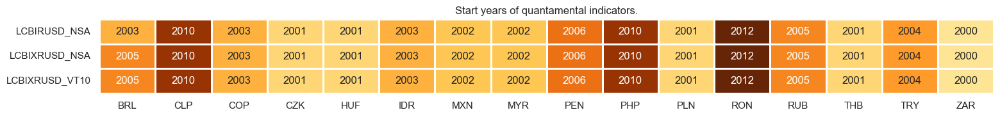

In [9]:
xcatx = rets
cidx = cids_em

msm.check_availability(dfx, xcats = xcatx, cids = cidx, missing_recent=False)

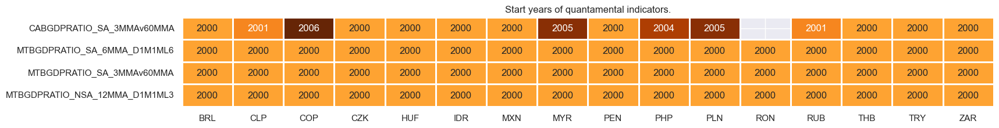

In [10]:
xcatx = list(set([dict_repl.get(item, item) for item in xbch]))
cidx = cids_em

msm.check_availability(dfx, xcats = xcatx, cids = cidx, missing_recent=False)

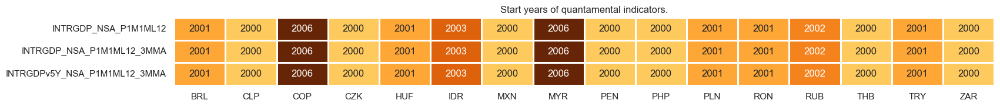

In [11]:
xcatx = igdp
cidx = cids_em

msm.check_availability(dfx, xcats = xcatx, cids = cidx, missing_recent=False)

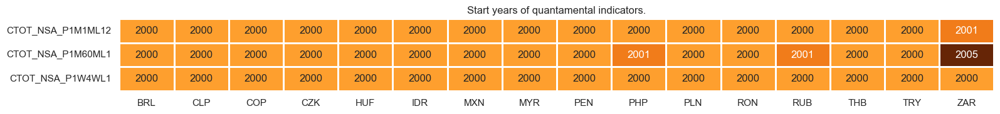

In [12]:
xcatx = list(set([dict_repl.get(item, item) for item in tots]))
cidx = cids_em

msm.check_availability(dfx, xcats = xcatx, cids = cidx, missing_recent=False)

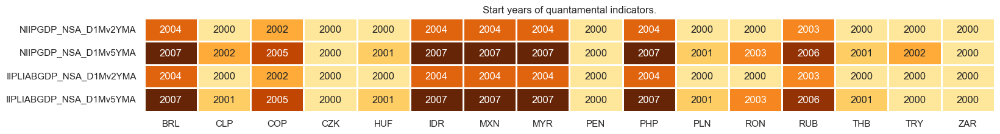

In [13]:
xcatx = niip
cidx = cids_em

msm.check_availability(dfx, xcats = xcatx, cids = cidx, missing_recent=False)

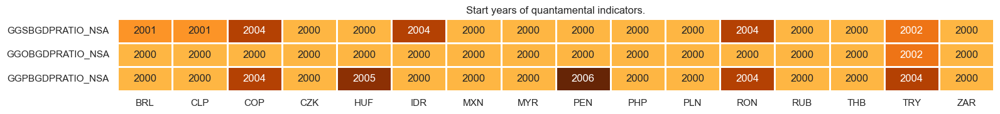

In [14]:
xcatx = dsus
cidx = cids_em

msm.check_availability(dfx, xcats = xcatx, cids = cidx, missing_recent=False)

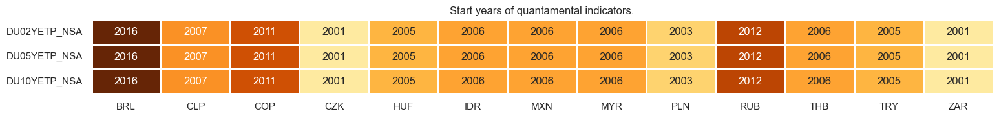

In [15]:
xcatx = dutp
cidx = cids_em

msm.check_availability(dfx, xcats = xcatx, cids = cidx, missing_recent=False)

### Blacklisting based on FX forward markets

In [16]:
dfb = dfx[dfx["xcat"].isin(["FXUNTRADABLE_NSA"])].loc[
    :, ["cid", "xcat", "real_date", "value"]
]
dfba = (
    dfb.groupby(["cid", "real_date"])
    .aggregate(value=pd.NamedAgg(column="value", aggfunc="max"))
    .reset_index()
)
dfba["xcat"] = "FXBLACK"
fxblack = msp.make_blacklist(dfba, "FXBLACK")
fxblack

{'MYR': (Timestamp('2018-07-02 00:00:00'), Timestamp('2026-06-12 00:00:00')),
 'PEN': (Timestamp('2021-07-01 00:00:00'), Timestamp('2021-07-30 00:00:00')),
 'RUB': (Timestamp('2022-02-01 00:00:00'), Timestamp('2026-06-12 00:00:00')),
 'THB': (Timestamp('2007-01-01 00:00:00'), Timestamp('2008-11-28 00:00:00')),
 'TRY_1': (Timestamp('2000-01-03 00:00:00'), Timestamp('2003-09-30 00:00:00')),
 'TRY_2': (Timestamp('2020-01-01 00:00:00'), Timestamp('2024-07-31 00:00:00'))}

## Local-currency bond index returns

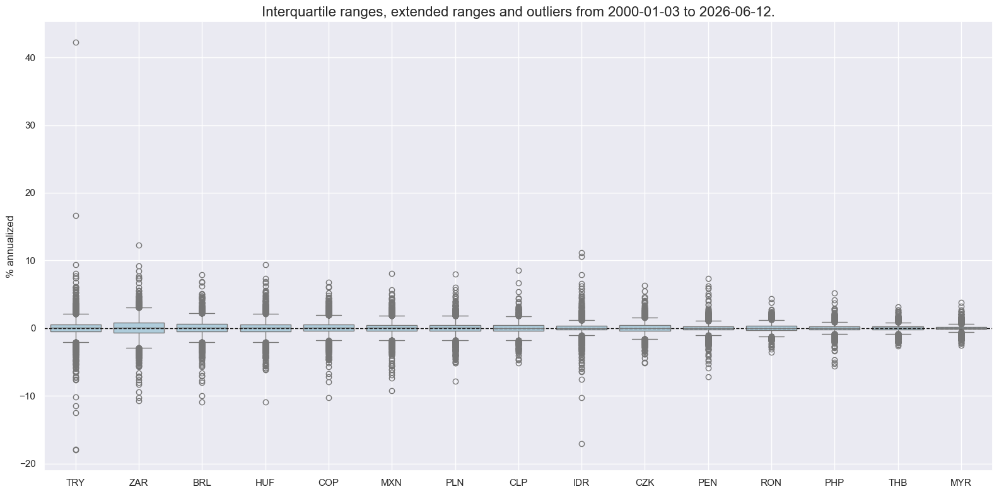

In [17]:
xcatx = [
    "LCBIRUSD_NSA",
]
cidx = sorted(list(set(cids_em) - set(["RUB"])))


msp.view_ranges(
    dfx,
    cids=cidx,
    xcats=xcatx,
    kind="box",
    sort_cids_by="std",
    title=None,
    ylab="% annualized",
    start="2000-01-01",
    title_fontsize=20,
)

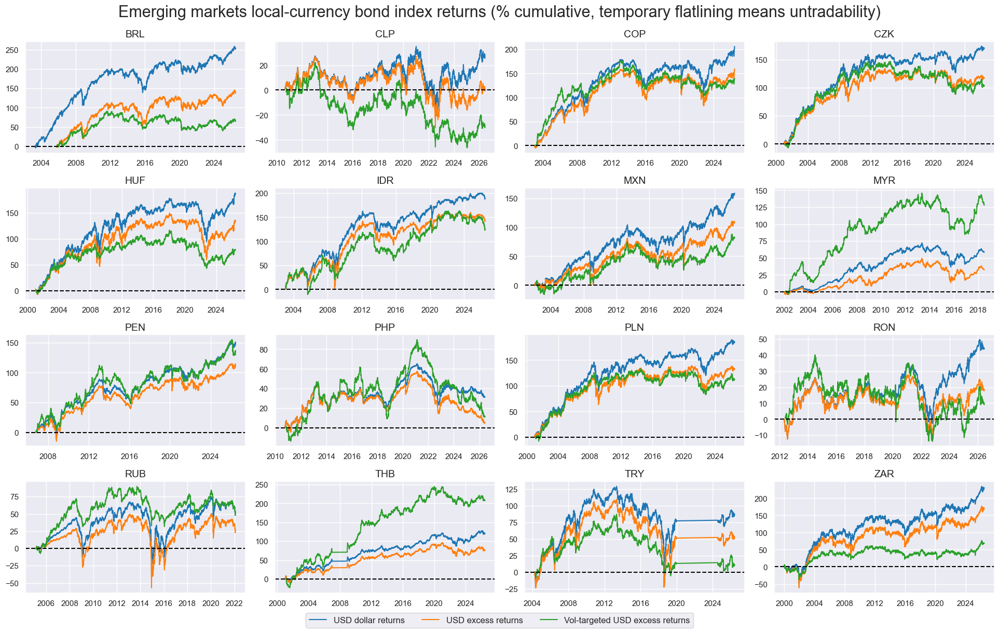

In [18]:
xcatx = ["LCBIRUSD_NSA", "LCBIXRUSD_NSA", "LCBIXRUSD_VT10"]
cidx = cids_em

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    cumsum=True,
    same_y=False,
    height=2.0,
    size=(10, 10),
    all_xticks=True,
    blacklist=fxblack,
    title="Emerging markets local-currency bond index returns (% cumulative, temporary flatlining means untradability)",
    title_fontsize=22,
    xcat_labels=[
        "USD dollar returns",
        "USD excess returns",
        "Vol-targeted USD excess returns",
    ],
    
)

In [19]:
# Estimated short-term historical volatility

xcatx = ["LCBIRUSD_NSA", "LCBIXRUSD_NSA"]
cidx = cids_em

dfa = pd.DataFrame(columns=dfx.columns)

for xc in xcatx:
    dfaa = msp.historic_vol(
        dfx,
        xcat=xc,
        cids=cidx,
        lback_periods=21,
        lback_meth="ma",
        half_life=11,
        est_freq="M",
        blacklist=fxblack,
        postfix="_ASD",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

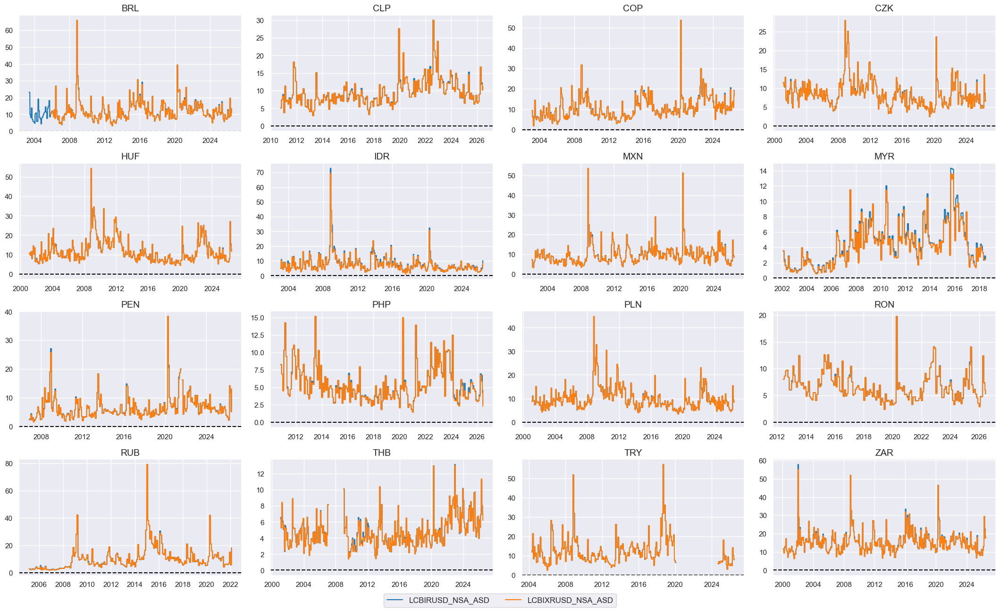

In [20]:
# Checkup of volatilities

xcatx = ["LCBIRUSD_NSA_ASD", "LCBIXRUSD_NSA_ASD"]
cidx = cids_em

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    same_y=False,
    height=2.2,
    size=(10, 10),
    all_xticks=True,
)

## Factor construction and checks

In [21]:
# Initiate labeling dictionary
dict_lab = {}
concept_factors_zn = {}

### External balance improvement

In [22]:
# All constituents, signs, and weights

dict_xbch = {
    "MTBGDPRATIO_SA_3MMAv60MMA": {"sign": 1, "weight": 1/4},
    "CABGDPRATIO_SA_3MMAv60MMA": {"sign": 1, "weight": 1/4},
    'MTBGDPRATIO_NSA_12MMA_D1M1ML3': {"sign": 1, "weight": 1/4},
    'MTBGDPRATIO_SA_6MMA_D1M1ML6': {"sign": 1, "weight": 1/4},
}

In [23]:
# Normalized categories with theoretical positive effects

dix = dict_xbch
cidx = cids_em

# Contingent negative values

if any (v["sign"] < 0 for v in dix.values()):
    calcs=[]
    dfa = pd.DataFrame(columns=dfx.columns)
    for xc, values in dix.items():
        if values["sign"] < 0:
            calcs.append(f"{xc}NEG = {xc} * -1")
            dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
    dfx = msm.update_df(dfx, dfa)

# Sequential normalization of categories

postfixes = ["NEG" if v["sign"] < 0 else "" for v in dix.values()]
xcatx = [k + pf for k, pf in zip(dix.keys(), postfixes)] 

for xc in xcatx:
    dfa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 3,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfx = msm.update_df(dfx, dfa)

xbchz = [xc + "_ZN" for xc in xcatx]

In [24]:
# Conceptual factor score

dix = dict_xbch
xcatx = xbchz
cidx = cids_em

# Composite score

weights = [v["weight"] for v in dix.values()]
cfs = "XBCH"

dfa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    weights=weights,
    new_xcat=cfs,
    complete_xcats=False,
)
dfx= msm.update_df(dfx, dfa)

# Re-score

dfa = msp.make_zn_scores(
    dfx,
    xcat=cfs,
    cids=cidx,
    sequential=True,
    min_obs=261 * 3,
    neutral="zero",
    pan_weight=1,
    thresh=3,
    postfix="_ZN",
    est_freq="m",
)
dfx = msm.update_df(dfx, dfa)

cfs_zn = f"{cfs}_ZN"
concept_factors_zn[cfs_zn] = "External balance improvement"

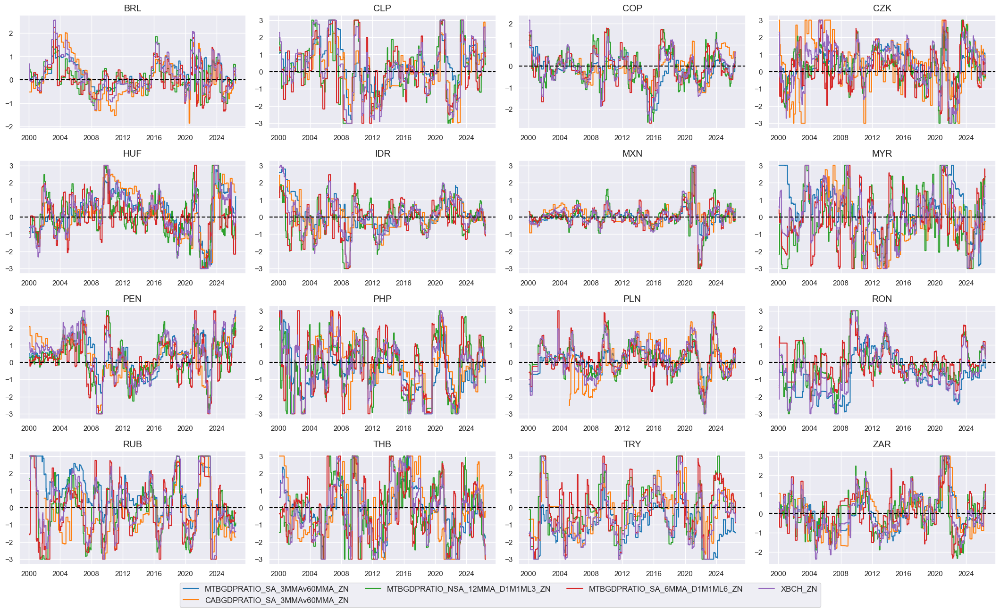

In [25]:
# Visualize

xcatx = xbchz + ["XBCH_ZN"]
cidx = cids_em

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    same_y=False,
    height=2.2,
    size=(10, 10),
    all_xticks=True,
)

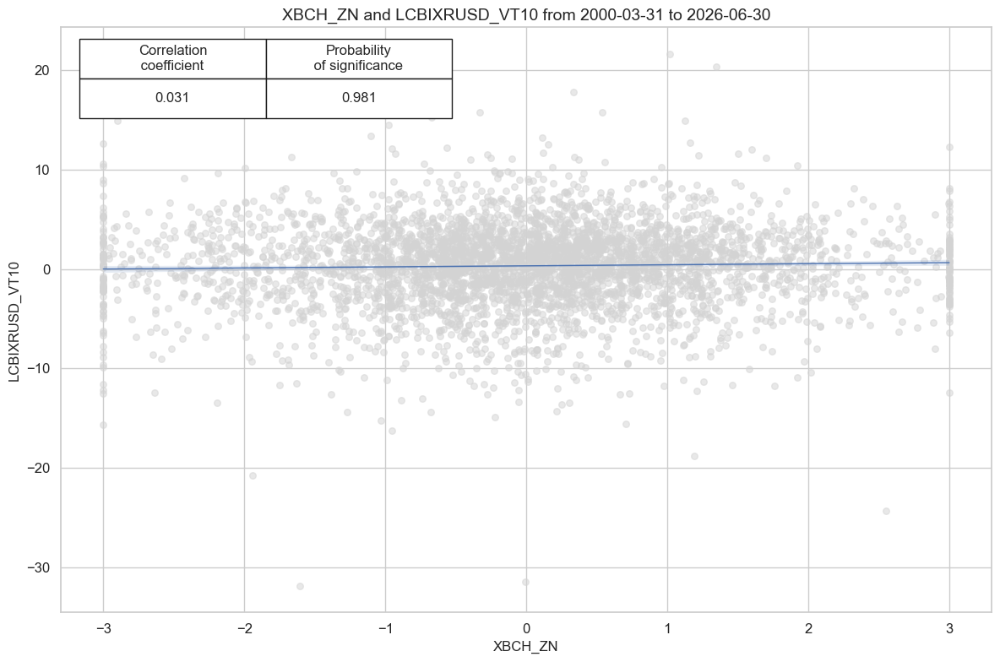

,,,,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
Return,Signal,Frequency,Aggregation,,,,,,,,,,,
LCBIXRUSD_VT10,XBCH_ZN,M,last,0.524,0.524,0.504,0.571,0.594,0.453,0.031,0.048,0.024,0.025,0.524


In [26]:
# checking - to delete later 

cidx = cids_em
sig = "XBCH_ZN"
targ = "LCBIXRUSD_VT10"

cr = msp.CategoryRelations(
        dfx,
        xcats=[sig, targ],
        cids=cidx,
        freq="M",
        blacklist=fxblack,
        lag=1,
        xcat_aggs=["last", "sum"],
        start="2000-01-01",
      
    )
cr.reg_scatter(coef_box="upper left", prob_est="map")


srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=sig,
    rets=targ,
    freqs="M",
    start="2000-01-01",
    blacklist=fxblack,
)
display(srr.multiple_relations_table().round(3))

###  Relative GDP growth

In [27]:
# Preparatory: relative values to U.S.

xcatx = igdp
cidx = cids

cidx = cids

for xc in xcatx:
    dfa = msp.make_relative_value(
        dfx,
        xcats=xcatx,
        cids=cidx,
        basket=["USD"],  
        rel_meth="subtract",
        postfix="vUSD",
    )
    dfx = msm.update_df(df=dfx, df_add=dfa)

In [28]:
# All constituents, signs, and weights

dict_rgdp = {
    'INTRGDP_NSA_P1M1ML12vUSD': {"sign": 1, "weight": 1/3},
    'INTRGDP_NSA_P1M1ML12_3MMAvUSD': {"sign": 1, "weight": 1/3},
    'INTRGDPv5Y_NSA_P1M1ML12_3MMAvUSD': {"sign": 1, "weight": 1/3},
}

In [29]:
# Normalized categories with theoretical positive effects

dix = dict_rgdp
cidx = cids_em

# Contingent negative values

if any (v["sign"] < 0 for v in dix.values()):
    calcs=[]
    dfa = pd.DataFrame(columns=dfx.columns)
    for xc, values in dix.items():
        if values["sign"] < 0:
            calcs.append(f"{xc}NEG = {xc} * -1")
            dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
    dfx = msm.update_df(dfx, dfa)

# Sequential normalization of categories

postfixes = ["NEG" if v["sign"] < 0 else "" for v in dix.values()]
xcatx = [k + pf for k, pf in zip(dix.keys(), postfixes)] 

for xc in xcatx:
    dfa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 3,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfx = msm.update_df(dfx, dfa)

rgdpz = [xc + "_ZN" for xc in xcatx]

In [30]:
# Conceptual factor score

dix = dict_rgdp
xcatx = rgdpz
cidx = cids

# Composite score

weights = [v["weight"] for v in dix.values()]
cfs = "RGDP"

dfa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    weights=weights,
    new_xcat=cfs,
    complete_xcats=False,
)
dfx= msm.update_df(dfx, dfa)

# Re-score

dfa = msp.make_zn_scores(
    dfx,
    xcat=cfs,
    cids=cidx,
    sequential=True,
    min_obs=261 * 3,
    neutral="zero",
    pan_weight=1,
    thresh=3,
    postfix="_ZN",
    est_freq="m",
)
dfx = msm.update_df(dfx, dfa)

cfs_zn = f"{cfs}_ZN"
concept_factors_zn[cfs_zn] = "Relative GDP growth"

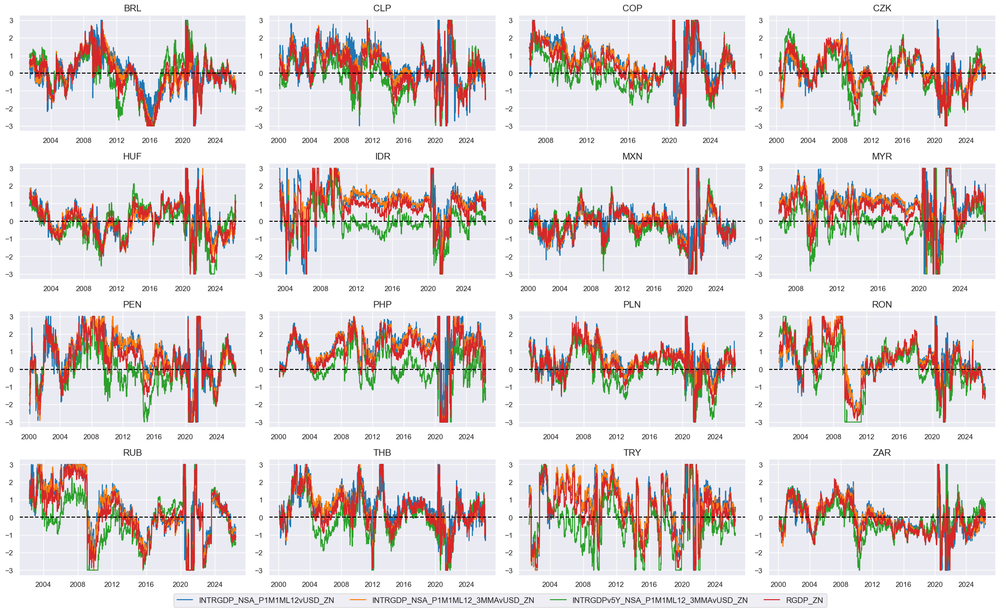

In [31]:
# Visualize

xcatx = rgdpz + ["RGDP_ZN"]
cidx = cids_em

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    same_y=False,
    height=2.2,
    size=(10, 10),
    all_xticks=True,
)

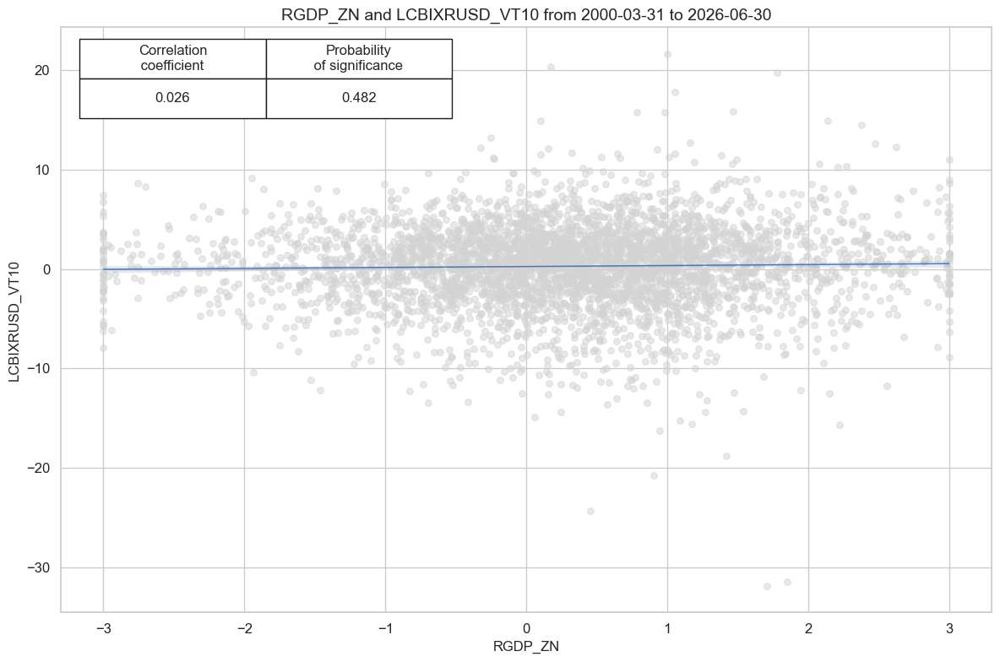

,,,,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
Return,Signal,Frequency,Aggregation,,,,,,,,,,,
LCBIXRUSD_VT10,RGDP_ZN,M,last,0.525,0.509,0.622,0.568,0.575,0.444,0.026,0.109,0.019,0.068,0.509


In [32]:
# checking - to delete later 
cidx = cids_em
sig = "RGDP_ZN"
targ = "LCBIXRUSD_VT10"

cr = msp.CategoryRelations(
        dfx,
        xcats=[sig, targ],
        cids=cidx,
        freq="M",
        blacklist=fxblack,
        lag=1,
        xcat_aggs=["last", "sum"],
        start="2000-01-01",
      
    )
cr.reg_scatter(coef_box="upper left", prob_est="map")


srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=sig,
    rets=targ,
    freqs="M",
    start="2000-01-01",
    blacklist=fxblack,
)
display(srr.multiple_relations_table().round(3))

###  Terms-of-trade improvement

In [33]:
# All constituents, signs, and weights

dict_tot = {
    "CTOT_NSA_P1M1ML12": {"sign": 1, "weight": 1/3},
    "CTOT_NSA_P1W4WL1": {"sign": 1, "weight": 1/3},
    "CTOT_NSA_P1M60ML1": {"sign": 1, "weight": 1/3},  
}

In [34]:
# Normalized categories with theoretical positive effects

dix = dict_tot
cidx = cids_em

# Contingent negative values

if any (v["sign"] < 0 for v in dix.values()):
    calcs=[]
    dfa = pd.DataFrame(columns=dfx.columns)
    for xc, values in dix.items():
        if values["sign"] < 0:
            calcs.append(f"{xc}NEG = {xc} * -1")
            dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
    dfx = msm.update_df(dfx, dfa)

# Sequential normalization of categories

postfixes = ["NEG" if v["sign"] < 0 else "" for v in dix.values()]
xcatx = [k + pf for k, pf in zip(dix.keys(), postfixes)] 

for xc in xcatx:
    dfa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 3,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfx = msm.update_df(dfx, dfa)

totz = [xc + "_ZN" for xc in xcatx]

In [35]:
# Conceptual factor score

dix = dict_tot
xcatx = totz
cidx = cids_em

# Composite score

weights = [v["weight"] for v in dix.values()]
cfs = "TOT"

dfa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    weights=weights,
    new_xcat=cfs,
    complete_xcats=False,
)
dfx= msm.update_df(dfx, dfa)

# Re-score

dfa = msp.make_zn_scores(
    dfx,
    xcat=cfs,
    cids=cidx,
    sequential=True,
    min_obs=261 * 3,
    neutral="zero",
    pan_weight=1,
    thresh=3,
    postfix="_ZN",
    est_freq="m",
)
dfx = msm.update_df(dfx, dfa)

cfs_zn = f"{cfs}_ZN"
concept_factors_zn[cfs_zn] = "Terms of trade improvement"

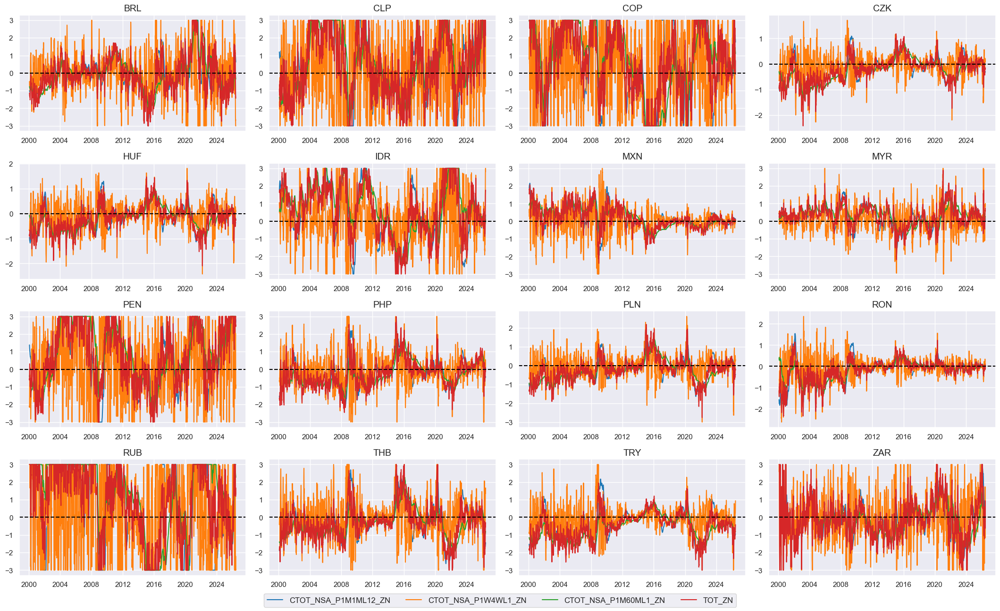

In [36]:
# Visualize

xcatx = totz + ["TOT_ZN"]
cidx = cids_em

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    same_y=False,
    height=2.2,
    size=(10, 10),
    all_xticks=True,
)

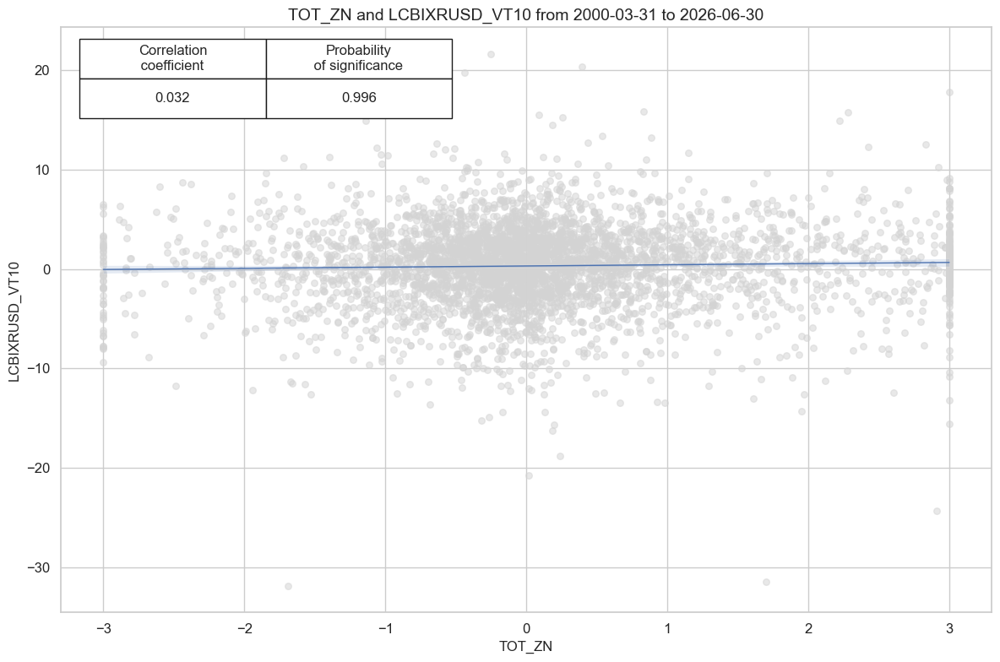

,,,,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
Return,Signal,Frequency,Aggregation,,,,,,,,,,,
LCBIXRUSD_VT10,TOT_ZN,M,last,0.517,0.519,0.488,0.571,0.59,0.448,0.032,0.04,0.026,0.013,0.519


In [37]:
# checking - to delete later 
cidx = cids_em
sig = "TOT_ZN"
targ = "LCBIXRUSD_VT10"

cr = msp.CategoryRelations(
        dfx,
        xcats=[sig, targ],
        cids=cidx,
        freq="M",
        blacklist=fxblack,
        lag=1,
        xcat_aggs=["last", "sum"],
        start="2000-01-01",
       
    )
cr.reg_scatter(coef_box="upper left", prob_est="map")


srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=sig,
    rets=targ,
    freqs="M",
    start="2000-01-01",
    blacklist=fxblack,
)
display(srr.multiple_relations_table().round(3))

### International investment dynamics

In [38]:
# All constituents, signs, and weights

dict_iipd = {
    'NIIPGDP_NSA_D1Mv2YMA': {"sign": 1, "weight": 1/4},
    'NIIPGDP_NSA_D1Mv5YMA': {"sign": 1, "weight": 1/4},
    'IIPLIABGDP_NSA_D1Mv2YMA': {"sign": -1, "weight": 1/4},
    'IIPLIABGDP_NSA_D1Mv5YMA': {"sign": -1, "weight": 1/4},
}

In [39]:
# Normalized categories with theoretical positive effects

dix = dict_iipd
cidx = cids_em

# Contingent negative values

if any (v["sign"] < 0 for v in dix.values()):
    calcs=[]
    dfa = pd.DataFrame(columns=dfx.columns)
    for xc, values in dix.items():
        if values["sign"] < 0:
            calcs.append(f"{xc}NEG = {xc} * -1")
            dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
    dfx = msm.update_df(dfx, dfa)

# Sequential normalization of categories

postfixes = ["NEG" if v["sign"] < 0 else "" for v in dix.values()]
xcatx = [k + pf for k, pf in zip(dix.keys(), postfixes)] 

for xc in xcatx:
    dfa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 3,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfx = msm.update_df(dfx, dfa)

iipdz = [xc + "_ZN" for xc in xcatx]

In [40]:
# Conceptual factor score

dix = dict_iipd
xcatx = iipdz
cidx = cids_em

# Composite score

weights = [v["weight"] for v in dix.values()]
cfs = "IIPD"

dfa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    weights=weights,
    new_xcat=cfs,
    complete_xcats=False,
)
dfx= msm.update_df(dfx, dfa)

# Re-score

dfa = msp.make_zn_scores(
    dfx,
    xcat=cfs,
    cids=cidx,
    sequential=True,
    min_obs=261 * 3,
    neutral="zero",
    pan_weight=1,
    thresh=3,
    postfix="_ZN",
    est_freq="m",
)
dfx = msm.update_df(dfx, dfa)

cfs_zn = f"{cfs}_ZN"
concept_factors_zn[cfs_zn] = "International investment dynamics"

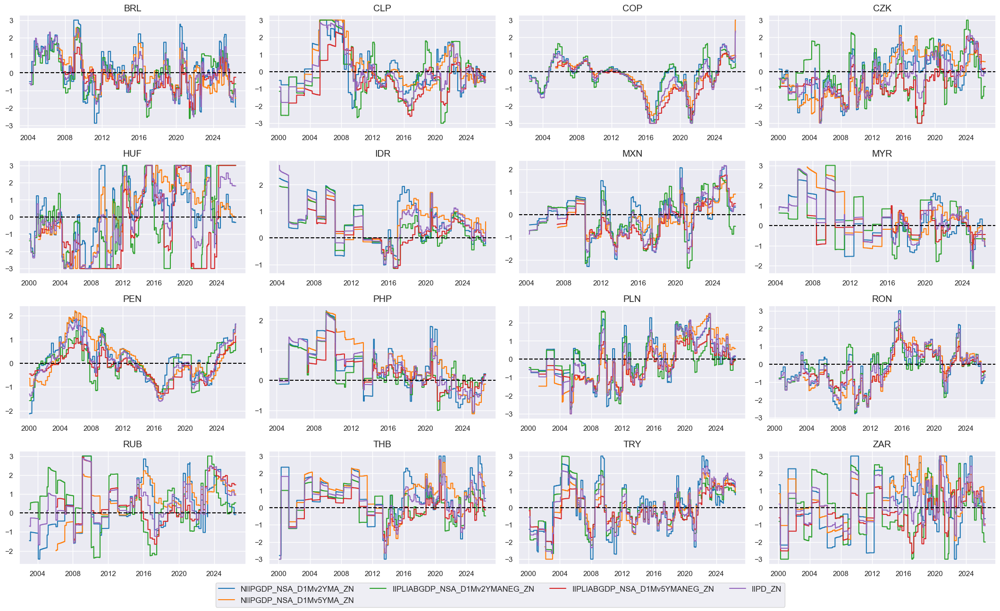

In [41]:
# Visualize

xcatx = iipdz + ["IIPD_ZN"]
cidx = cids_em

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    same_y=False,
    height=2.2,
    size=(10, 10),
    all_xticks=True,
)

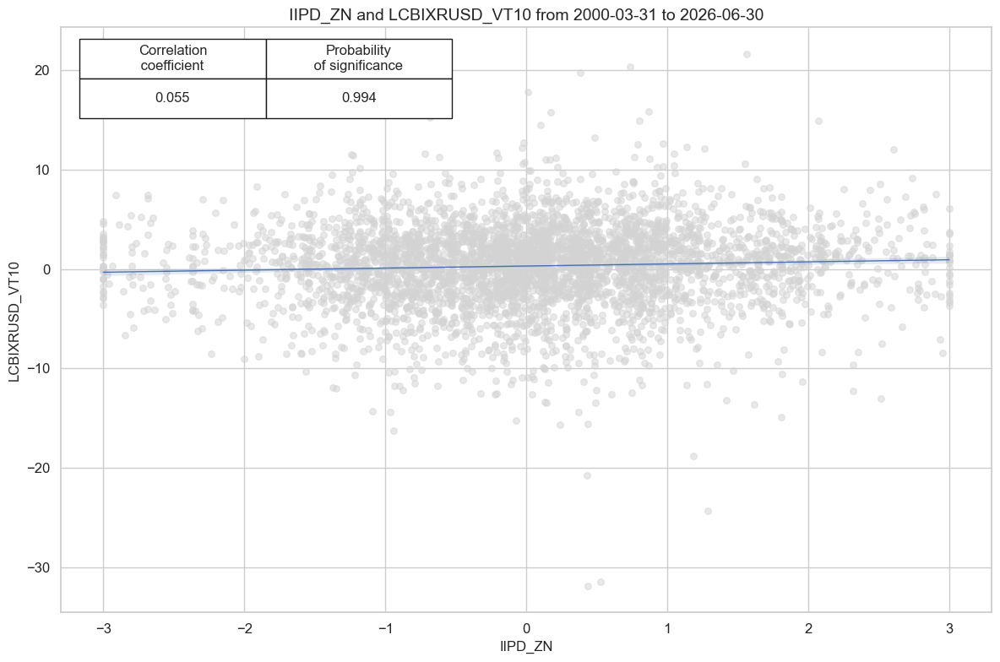

,,,,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
Return,Signal,Frequency,Aggregation,,,,,,,,,,,
LCBIXRUSD_VT10,IIPD_ZN,M,last,0.541,0.539,0.515,0.57,0.608,0.47,0.055,0.001,0.048,0.0,0.54


In [42]:
# checking - to delete later 
cidx = cids_em
sig = "IIPD_ZN"
targ = "LCBIXRUSD_VT10"

cr = msp.CategoryRelations(
        dfx,
        xcats=[sig, targ],
        cids=cidx,
        freq="M",
        blacklist=fxblack,
        lag=1,
        xcat_aggs=["last", "sum"],
        start="2000-01-01",
       # xcat_trims=[10, 10]  # maybe trim outlier
    )
cr.reg_scatter(coef_box="upper left", prob_est="map")


srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=sig,
    rets=targ,
    freqs="M",
    start="2000-01-01",
    blacklist=fxblack,
)
display(srr.multiple_relations_table().round(3))

### Fiscal balance strength

In [43]:
# Preparatory calculation

calcs = [
    "XGGPBGDPRATIO_NSA = GGPBGDPRATIO_NSA + 3",
    "XGGOBGDPRATIO_NSA = GGOBGDPRATIO_NSA + 3",
    "XGGSBGDPRATIO_NSA = GGSBGDPRATIO_NSA + 3",
]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids_em)
dfx = msm.update_df(dfx, dfa)

In [44]:
# All constituents, signs, and weights

dict_gbal = {
    'XGGPBGDPRATIO_NSA': {"sign": 1, "weight": 1/3},
    'XGGOBGDPRATIO_NSA': {"sign": 1, "weight": 1/3},
    'XGGSBGDPRATIO_NSA': {"sign": 1, "weight": 1/3},
}

In [45]:
# Normalized categories with theoretical positive effects

dix = dict_gbal
cidx = cids_em

# Contingent negative values

if any (v["sign"] < 0 for v in dix.values()):
    calcs=[]
    dfa = pd.DataFrame(columns=dfx.columns)
    for xc, values in dix.items():
        if values["sign"] < 0:
            calcs.append(f"{xc}NEG = {xc} * -1")
            dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
    dfx = msm.update_df(dfx, dfa)

# Sequential normalization of categories

postfixes = ["NEG" if v["sign"] < 0 else "" for v in dix.values()]
xcatx = [k + pf for k, pf in zip(dix.keys(), postfixes)] 

for xc in xcatx:
    dfa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 3,
        neutral="zero",  
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfx = msm.update_df(dfx, dfa)

xgbalz = [xc + "_ZN" for xc in xcatx]

In [46]:
# Conceptual factor score

dix = dict_gbal
xcatx = xgbalz
cidx = cids_em

# Composite score

weights = [v["weight"] for v in dix.values()]
cfs = "XGBAL"

dfa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    weights=weights,
    new_xcat=cfs,
    complete_xcats=False,
)
dfx= msm.update_df(dfx, dfa)

# Re-score

dfa = msp.make_zn_scores(
    dfx,
    xcat=cfs,
    cids=cidx,
    sequential=True,
    min_obs=261 * 3,
    neutral="zero",
    pan_weight=1,
    thresh=3,
    postfix="_ZN",
    est_freq="m",
)
dfx = msm.update_df(dfx, dfa)

cfs_zn = f"{cfs}_ZN"
concept_factors_zn[cfs_zn] = "Fiscal balance strength"

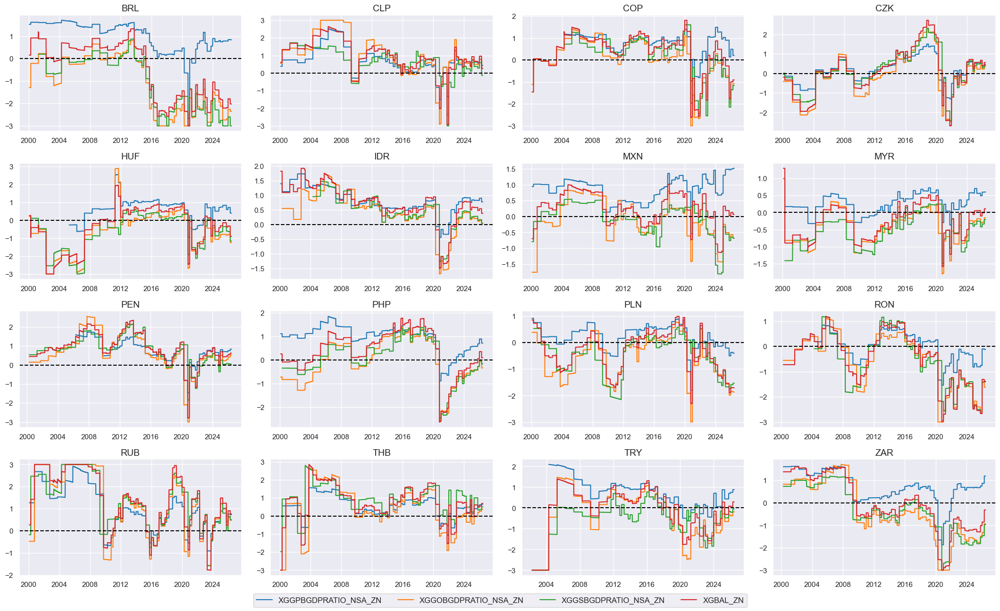

In [47]:
# Visualize

xcatx = xgbalz + ["XGBAL_ZN"]
cidx = cids_em

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    same_y=False,
    height=2.2,
    size=(10, 10),
    all_xticks=True,
)

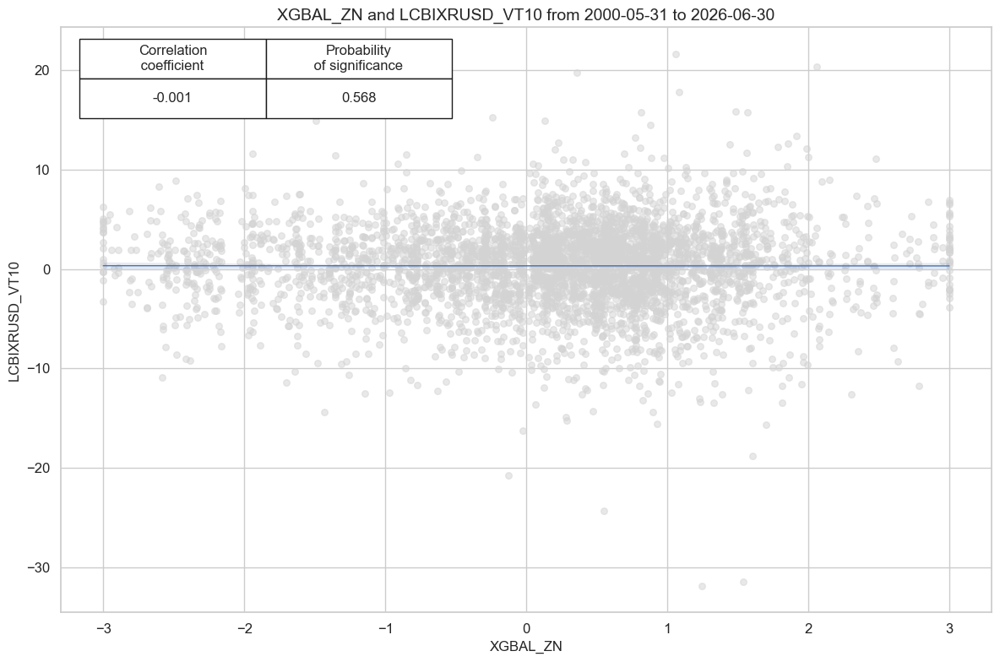

,,,,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
Return,Signal,Frequency,Aggregation,,,,,,,,,,,
LCBIXRUSD_VT10,XGBAL_ZN,M,last,0.53,0.51,0.649,0.571,0.578,0.442,-0.001,0.953,0.005,0.625,0.509


In [48]:
# checking - to delete later 
cidx = cids_em
sig = "XGBAL_ZN"
targ = "LCBIXRUSD_VT10"

cr = msp.CategoryRelations(
        dfx,
        xcats=[sig, targ],
        cids=cidx,
        freq="M",
        blacklist=fxblack,
        lag=1,
        xcat_aggs=["last", "sum"],
        start="2000-01-01",
       # xcat_trims=[10, 10]  # maybe trim outlier
    )
cr.reg_scatter(coef_box="upper left", prob_est="map")


srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=sig,
    rets=targ,
    freqs="M",
    start="2000-01-01",
    blacklist=fxblack,
)
display(srr.multiple_relations_table().round(3))

### Duration term premia

In [49]:
# All constituents, signs, and weights

dict_dutp = {
    "DU02YETP_NSA": {"sign": 1, "weight": 1/3},
    "DU05YETP_NSA": {"sign": 1, "weight": 1/3},
    "DU10YETP_NSA": {"sign": 1, "weight": 1/3},
}

In [50]:
# Normalized categories with theoretical positive effects

dix = dict_dutp
cidx = cids_em

# Contingent negative values

if any (v["sign"] < 0 for v in dix.values()):
    calcs=[]
    dfa = pd.DataFrame(columns=dfx.columns)
    for xc, values in dix.items():
        if values["sign"] < 0:
            calcs.append(f"{xc}NEG = {xc} * -1")
            dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
    dfx = msm.update_df(dfx, dfa)

# Sequential normalization of categories

postfixes = ["NEG" if v["sign"] < 0 else "" for v in dix.values()]
xcatx = [k + pf for k, pf in zip(dix.keys(), postfixes)] 

for xc in xcatx:
    dfa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 3,
        neutral="median",  # zero is not neutral
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfx = msm.update_df(dfx, dfa)

dutpz = [xc + "_ZN" for xc in xcatx]

In [51]:
# Global imputation of missing premia

xcatx = ["DU02YETP_NSA_ZN", "DU05YETP_NSA_ZN", "DU10YETP_NSA_ZN"]
cidx = cids_em

dfi = msp.impute_panel(dfx, cids=cidx, xcats=xcatx, threshold=0.5)
dfx = msm.update_df(dfx, dfi)

In [52]:
# Conceptual factor score

dix = dict_dutp
xcatx = dutpz
cidx = cids_em

# Composite score

weights = [v["weight"] for v in dix.values()]
cfs = "DUTP"

dfa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    weights=weights,
    new_xcat=cfs,
    complete_xcats=False,
)
dfx= msm.update_df(dfx, dfa)

# Re-score

dfa = msp.make_zn_scores(
    dfx,
    xcat=cfs,
    cids=cidx,
    sequential=True,
    min_obs=261 * 3,
    neutral="zero",
    pan_weight=1,
    thresh=3,
    postfix="_ZN",
    est_freq="m",
)
dfx = msm.update_df(dfx, dfa)

cfs_zn = f"{cfs}_ZN"
concept_factors_zn[cfs_zn] = "Duration term premium"

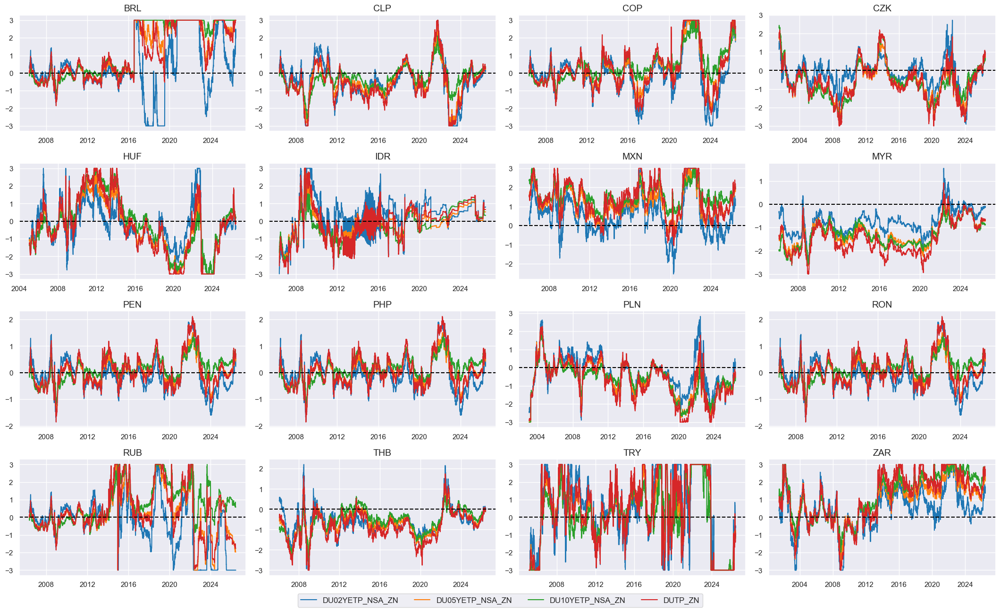

In [53]:
# Visualize

xcatx = dutpz + ["DUTP_ZN"]
cidx = cids_em

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    same_y=False,
    height=2.2,
    size=(10, 10),
    all_xticks=True,
)

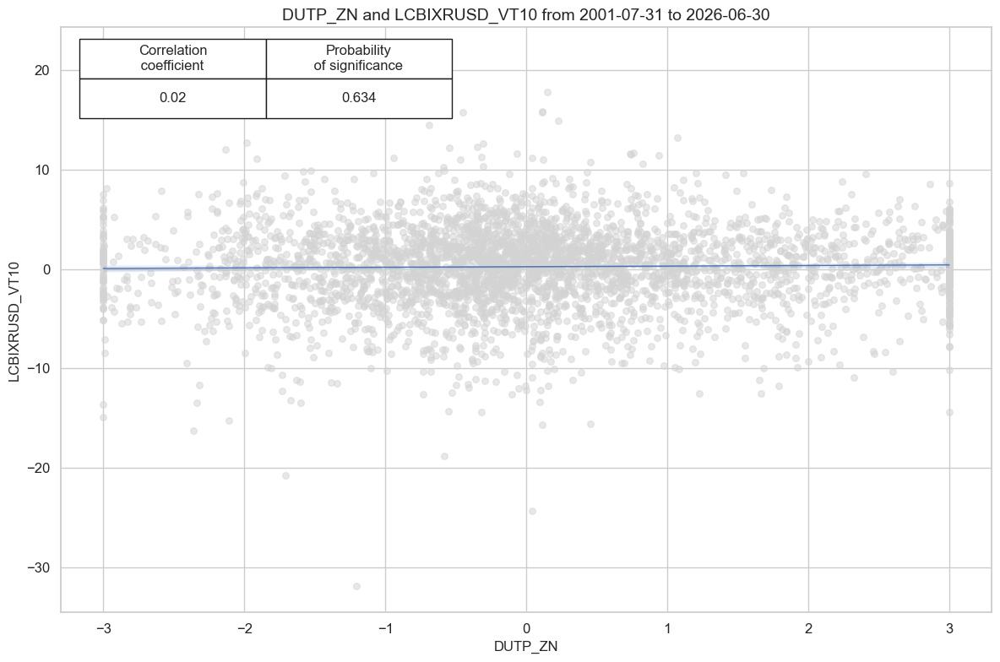

,,,,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
Return,Signal,Frequency,Aggregation,,,,,,,,,,,
LCBIXRUSD_VT10,DUTP_ZN,M,last,0.514,0.517,0.478,0.562,0.58,0.454,0.02,0.235,0.015,0.189,0.517


In [54]:
# checking - to delete later 
cidx = cids_em
sig = "DUTP_ZN"
targ = "LCBIXRUSD_VT10"

cr = msp.CategoryRelations(
        dfx,
        xcats=[sig, targ],
        cids=cidx,
        freq="M",
        blacklist=fxblack,
        lag=1,
        xcat_aggs=["last", "sum"],
        start="2000-01-01",
       # xcat_trims=[10, 10]  # maybe trim outlier
    )
cr.reg_scatter(coef_box="upper left", prob_est="map")


srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=sig,
    rets=targ,
    freqs="M",
    start="2000-01-01",
    blacklist=fxblack,
)
display(srr.multiple_relations_table().round(3))

### Factor overview and combination

In [55]:
# Weighted linear combinations
# Blacklist applied here (factor cells leave masking to the visualiser): ScoreVisualisers
# reuses this pre-computed COMP_ZN without re-applying the blacklist, so untradable
# cross-sections must already carry no composite score.
xcatx = list(concept_factors_zn.keys())
cidx = cids_em
sdate = "2000-01-01"
new_cat = "COMP"

dfa = msp.linear_composite(
    dfx,
    xcats=xcatx,
    cids=cidx,
    blacklist=fxblack,
    complete_xcats=False,
    start=sdate,
    new_xcat=new_cat,
)
dfx = msm.update_df(dfx, dfa)

dfa = msp.make_zn_scores(
    dfx,
    xcat=new_cat,
    cids=cidx,
    blacklist=fxblack,
    sequential=True,
    min_obs=261 * 5,
    neutral="zero",
    pan_weight=1,
    thresh=3,
    postfix="_ZN",
    est_freq="m",
)
dfx = msm.update_df(dfx, dfa)

cfs_zn = f"{new_cat}_ZN"
concept_factors_zn[cfs_zn] = "Composite"

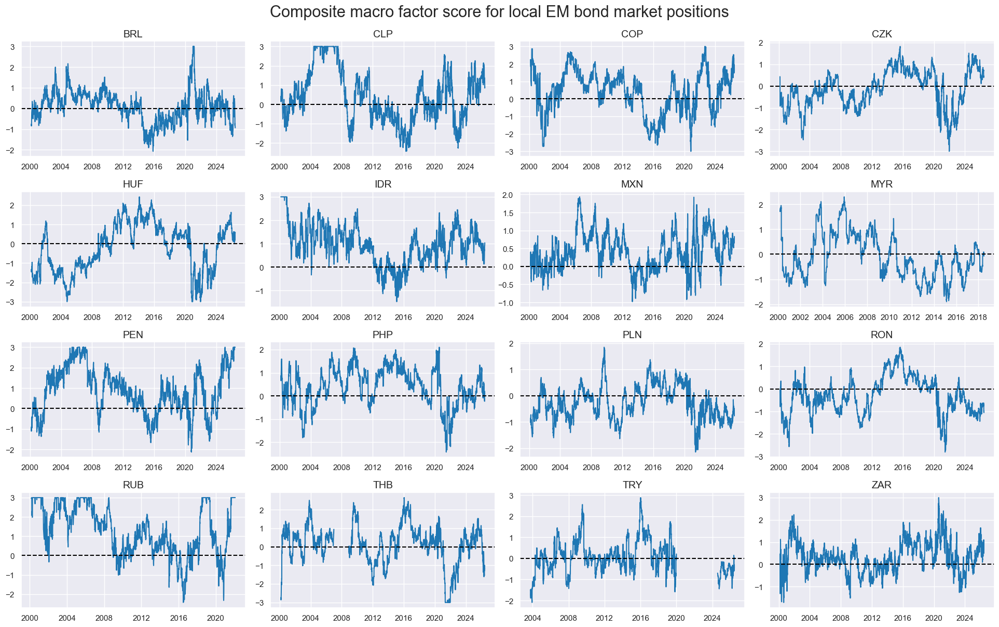

In [56]:
xcatx = ["COMP_ZN"]
cidx = cids_em

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2000-01-01",
    same_y=False,
    title="Composite macro factor score for local EM bond market positions",
    title_fontsize=22,
    height=2,
    size=(10, 10),
    all_xticks=True,
    blacklist=fxblack,
)

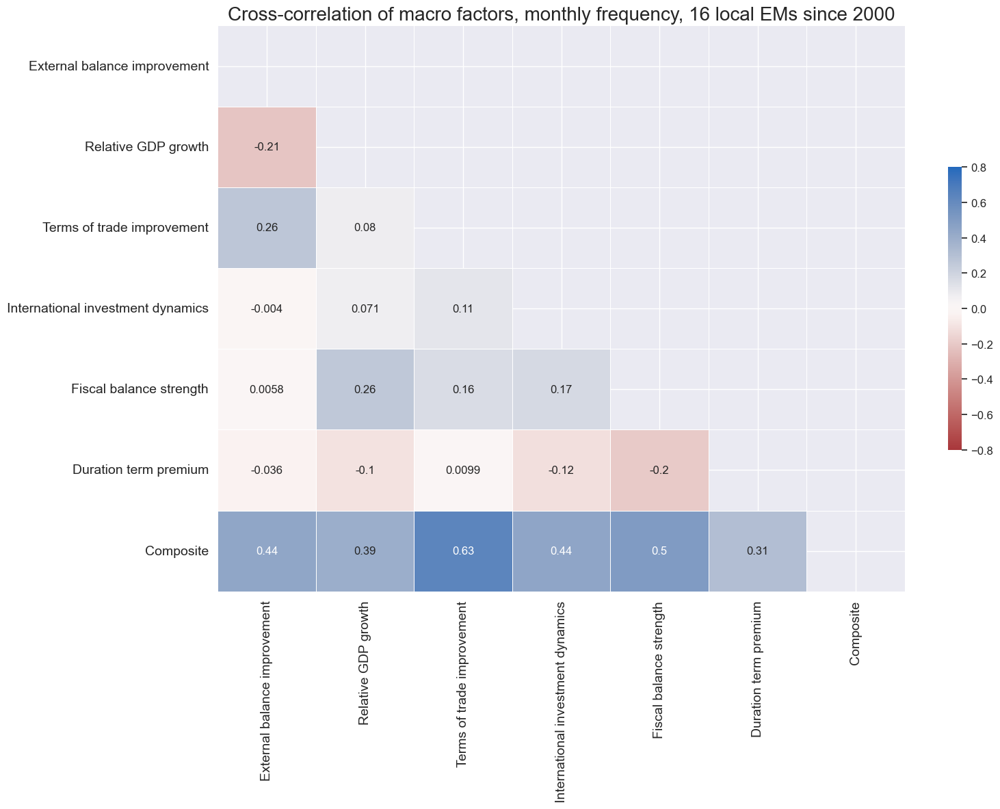

In [57]:
xcatx = list(concept_factors_zn.keys())
cidx = cids_em
sdate = "2000-01-01"

msp.correl_matrix(
    dfx,
    xcats=xcatx,
    cids=cidx,
    freq="M",
    title="Cross-correlation of macro factors, monthly frequency, 16 local EMs since 2000",
    title_fontsize=20,
    size=(16, 12),
    max_color=0.8,
    xcat_labels=concept_factors_zn,
    show=True,
    annot=True,
    start=sdate,
)

In [58]:
list(concept_factors_zn.keys())

['XBCH_ZN', 'RGDP_ZN', 'TOT_ZN', 'IIPD_ZN', 'XGBAL_ZN', 'DUTP_ZN', 'COMP_ZN']

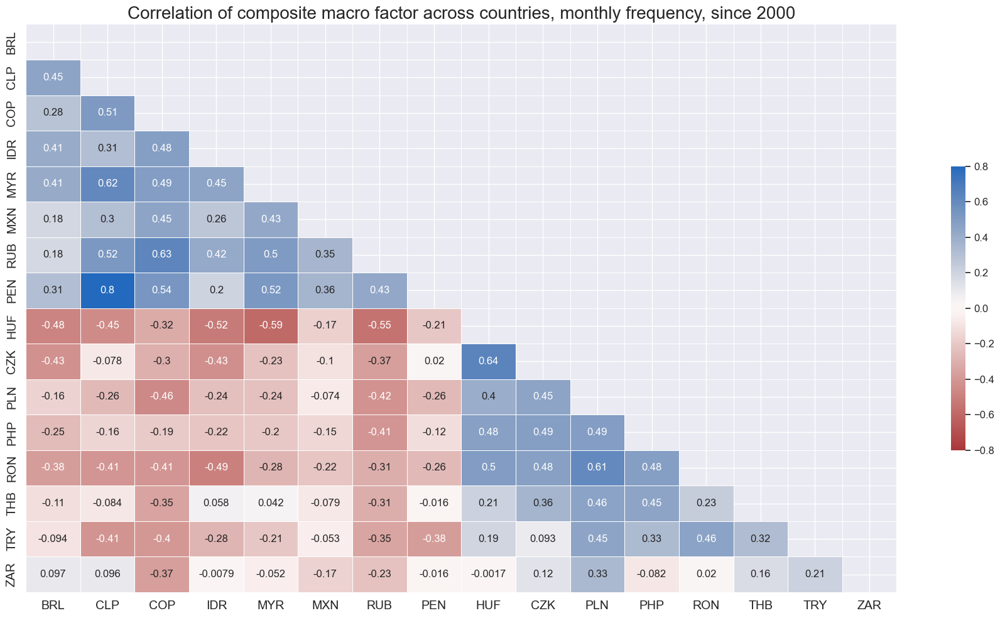

In [59]:
xcatx = ['COMP_ZN']
cidx = cids_em
sdate = "2000-01-01"

msp.correl_matrix(
    dfx,
    xcats=xcatx,
    cids=cidx,
    freq="M",
    title="Correlation of composite macro factor across countries, monthly frequency, since 2000",
    title_fontsize=20,
    size=(18, 10),
    max_color=0.8,
    xcat_labels=concept_factors_zn,
    show=True,
    annot=True,
    start=sdate,
    cluster=True,
)

## Macro-quantamental scorecards

### Snapshot

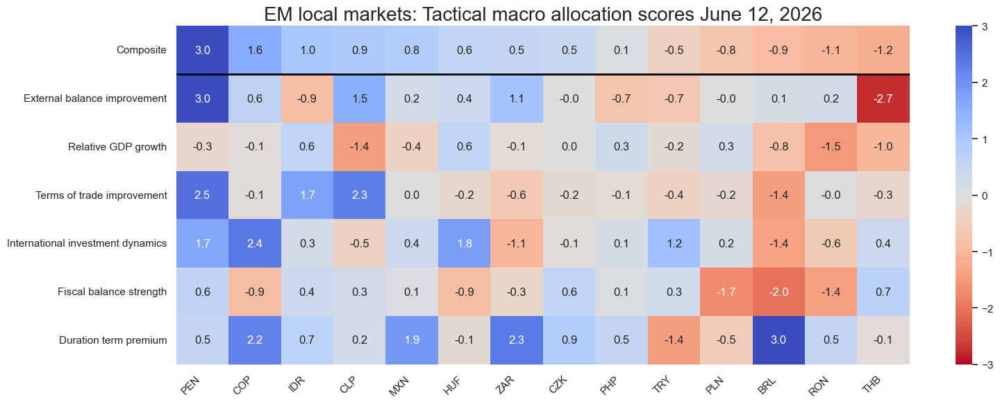

In [61]:
xcatx = list(concept_factors_zn.keys())
cidx = cids_em

# Set data of snapshot
backdate = datetime.strptime("2008-09-01", "%Y-%m-%d")
lastdate = datetime.strptime(END_DATE, "%Y-%m-%d")
snapdate = lastdate

sv = ScoreVisualisers(
    df=dfx,
    cids=cidx,
    xcats = xcatx,
    xcat_labels=concept_factors_zn,
    xcat_comp="COMP_ZN",
    no_zn_scores=True,
    rescore_composite=False,
    blacklist=fxblack,
)

sv.view_snapshot(
    cids=cidx,
    date=snapdate,
    transpose=True,
    sort_by_composite = True,
    title=f"EM local markets: Tactical macro allocation scores {snapdate.strftime('%B %d, %Y')}",
    title_fontsize=20,
    figsize=(16, 6),
    xcats=xcatx,
    xcat_labels=concept_factors_zn,
    round_decimals=1,
)

### Global history

Latest day:  2026-06-12 00:00:00


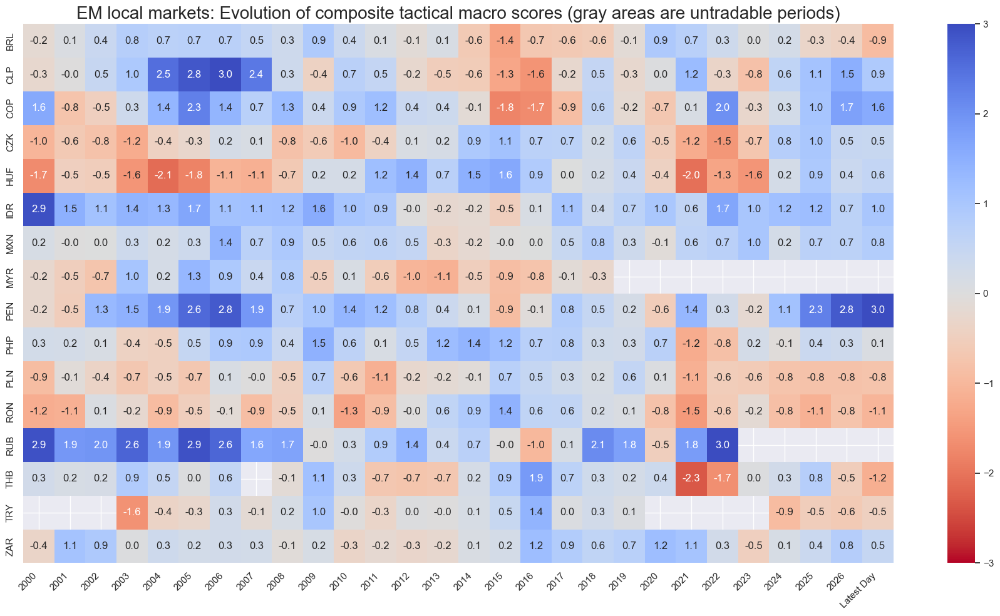

In [62]:
cidx = cids_em

sv.view_score_evolution(
    xcat="COMP_ZN",
    cids=cidx,
    freq="A",
    include_latest_day=True,
    transpose=False,
    title="EM local markets: Evolution of composite tactical macro scores (gray areas are untradable periods)",
    title_fontsize=20,
    start="2000-01-01",
    figsize=(18, 10),
    round_decimals=1,
)

Latest day:  2026-06-12 00:00:00


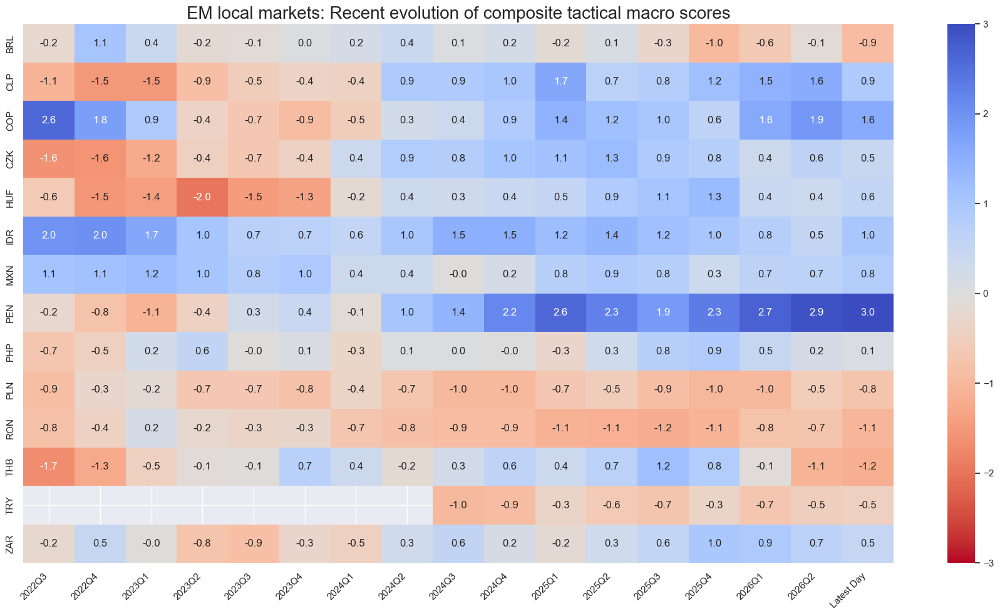

In [63]:
cidx = cids_em

sv.view_score_evolution(
    xcat="COMP_ZN",
    cids=cidx,
    freq="Q",
    include_latest_day=True,
    transpose=False,
    title="EM local markets: Recent evolution of composite tactical macro scores",
    title_fontsize=20,
    start="2022-07-01",
    figsize=(18, 10),
    round_decimals=1,
)

### Thematic history

Latest day:  2026-06-12 00:00:00


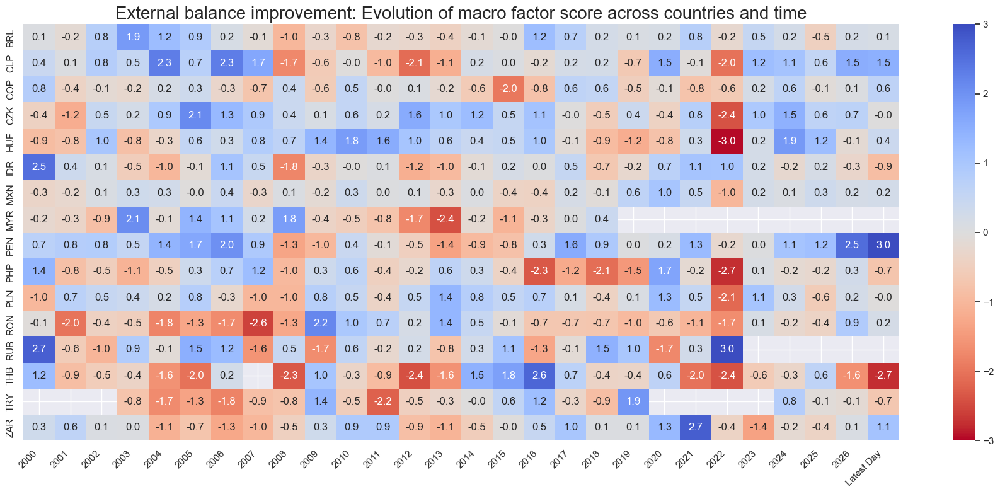

Latest day:  2026-06-12 00:00:00


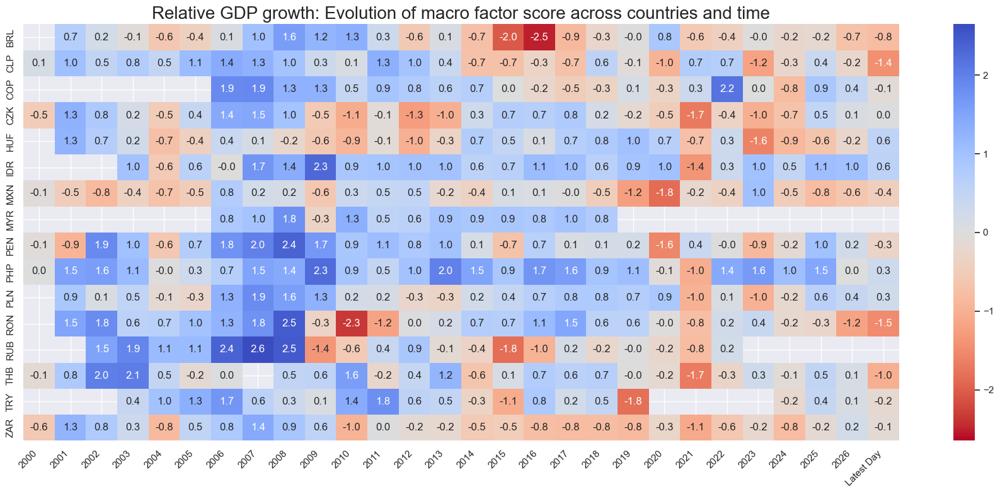

Latest day:  2026-06-12 00:00:00


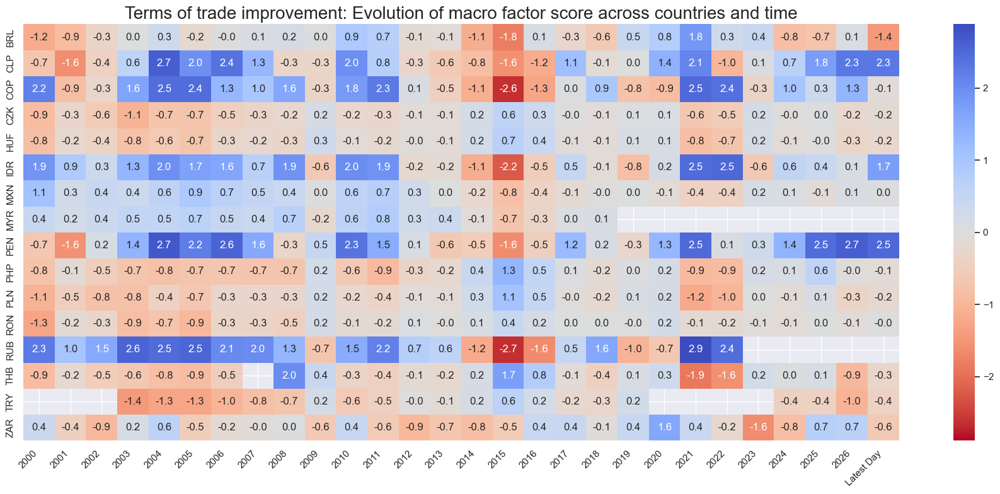

Latest day:  2026-06-12 00:00:00


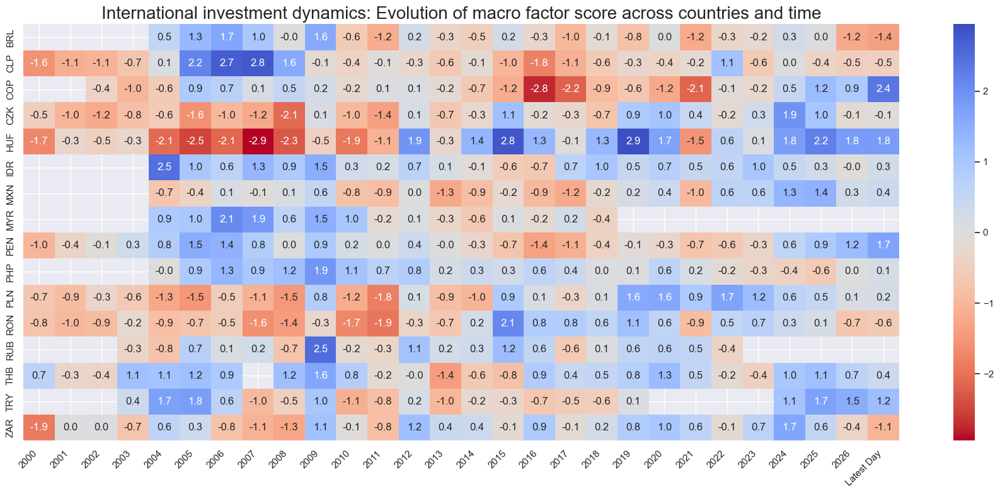

Latest day:  2026-06-12 00:00:00


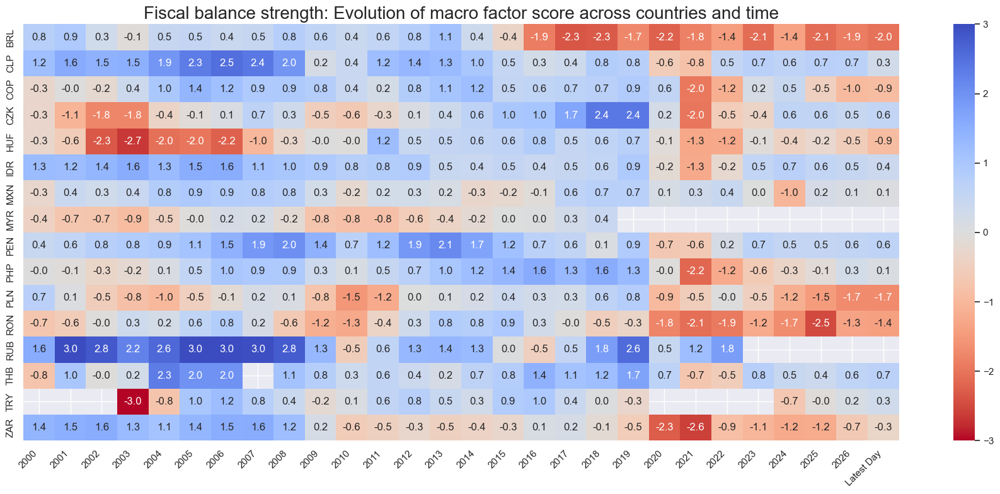

Latest day:  2026-06-12 00:00:00


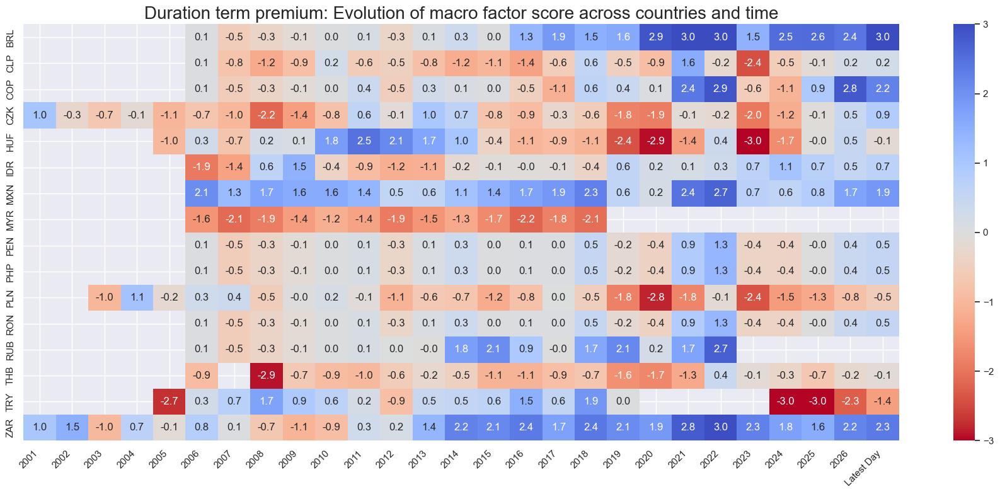

Latest day:  2026-06-12 00:00:00


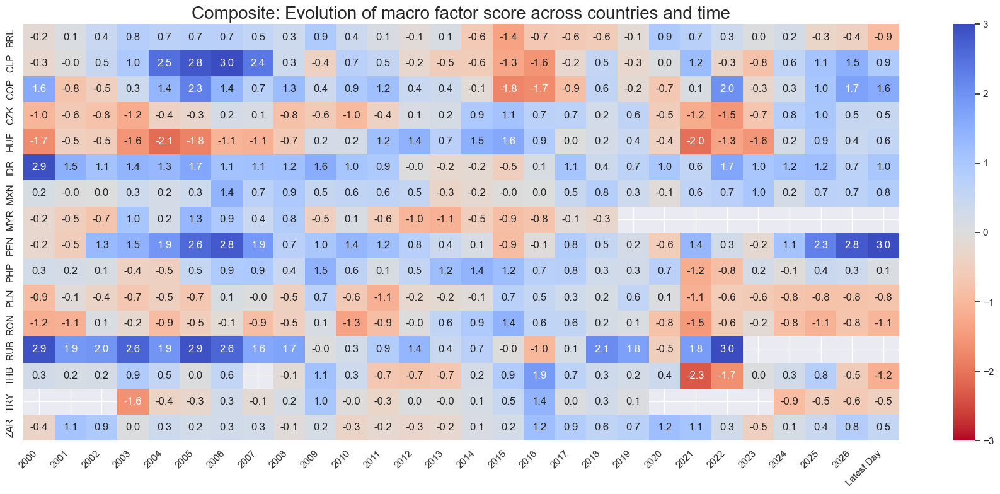

In [64]:
xcatx = list(concept_factors_zn.keys())
cidx = cids_em

for xcat in xcatx:
    xc_name = concept_factors_zn[xcat]
    sv.view_score_evolution(
        xcat=xcat,
        cids=cidx,
        freq="A",
        transpose=False,
        title=f"{xc_name}: Evolution of macro factor score across countries and time",
        title_fontsize=20,
        figsize=(18, 8),
        round_decimals=1,
        start="2000-01-01",
    )

### Country history

Latest day:  2026-06-12 00:00:00


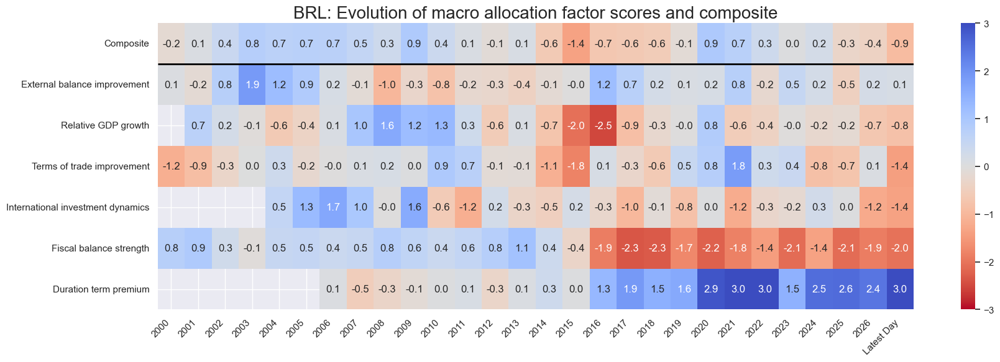

Latest day:  2026-06-12 00:00:00


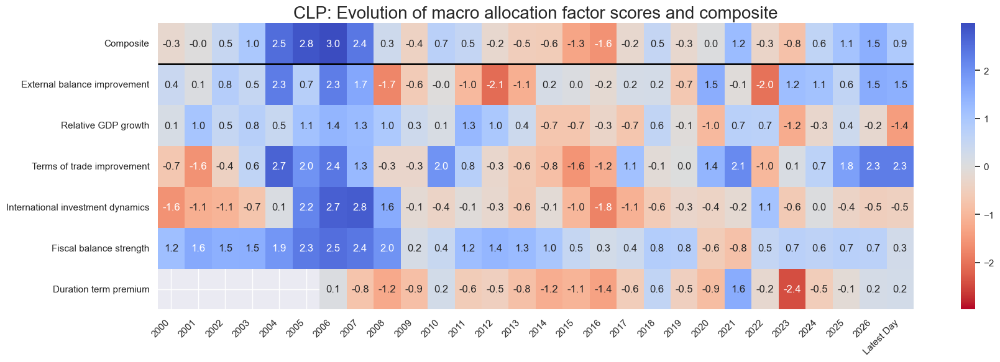

Latest day:  2026-06-12 00:00:00


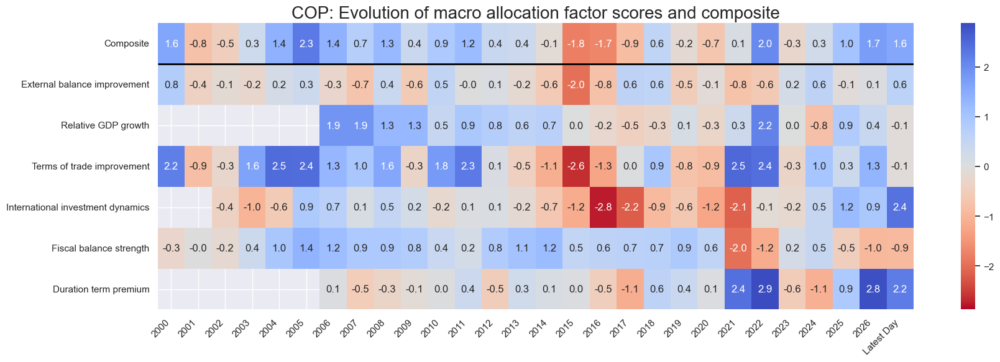

Latest day:  2026-06-12 00:00:00


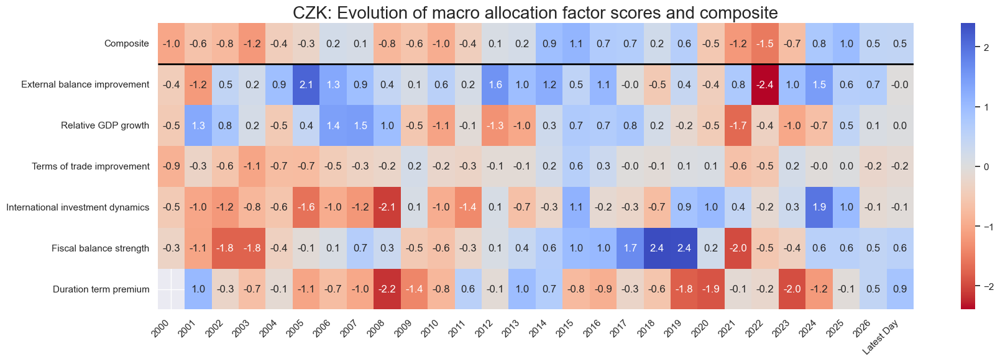

Latest day:  2026-06-12 00:00:00


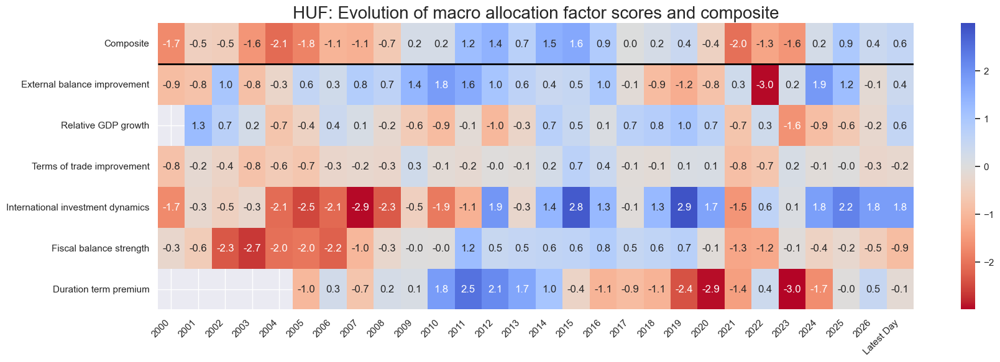

Latest day:  2026-06-12 00:00:00


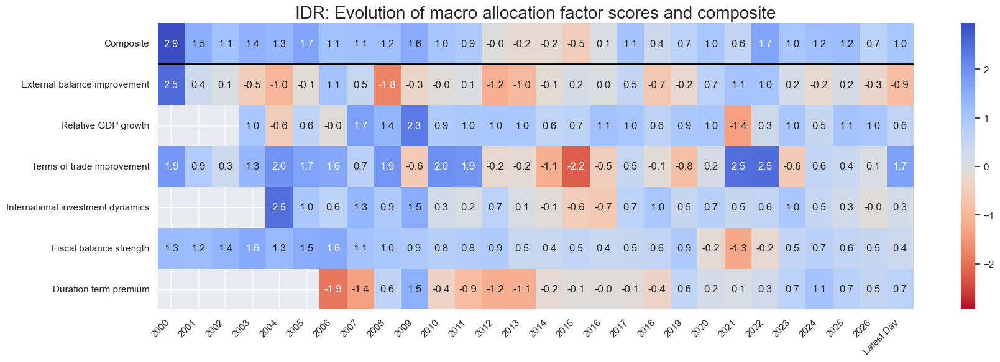

Latest day:  2026-06-12 00:00:00


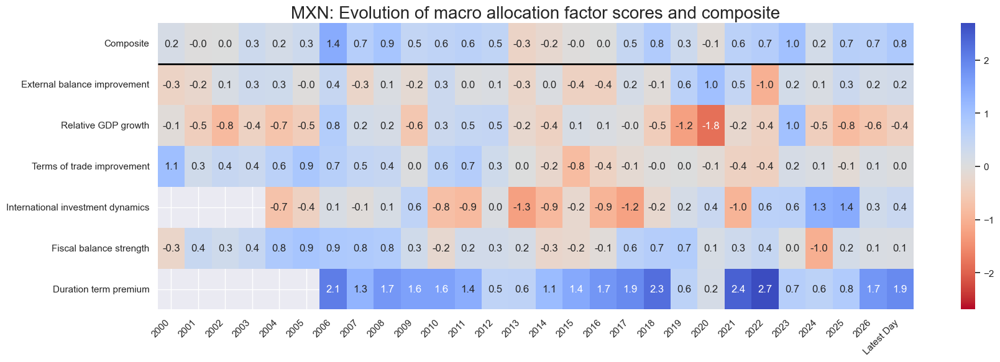

Latest day:  2018-06-29 00:00:00


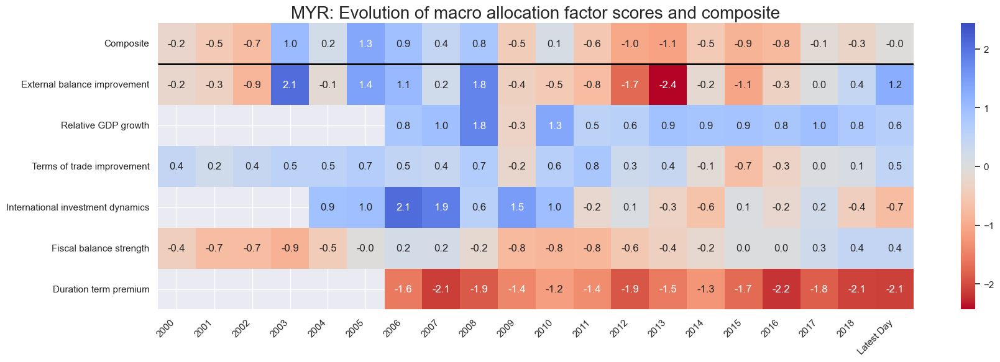

Latest day:  2026-06-12 00:00:00


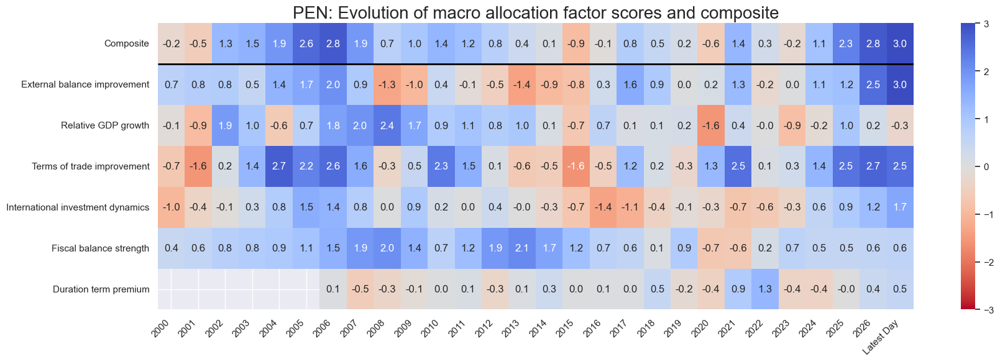

Latest day:  2026-06-12 00:00:00


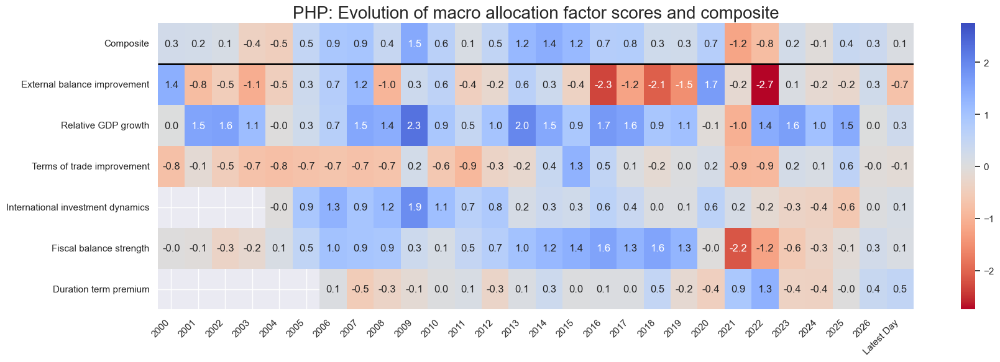

Latest day:  2026-06-12 00:00:00


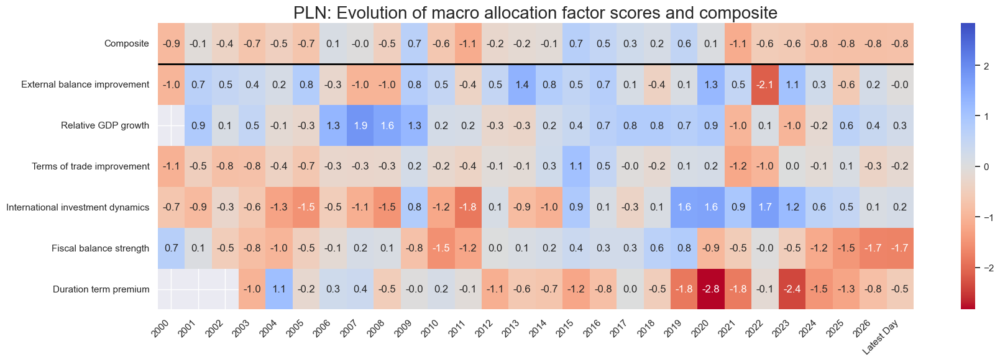

Latest day:  2026-06-12 00:00:00


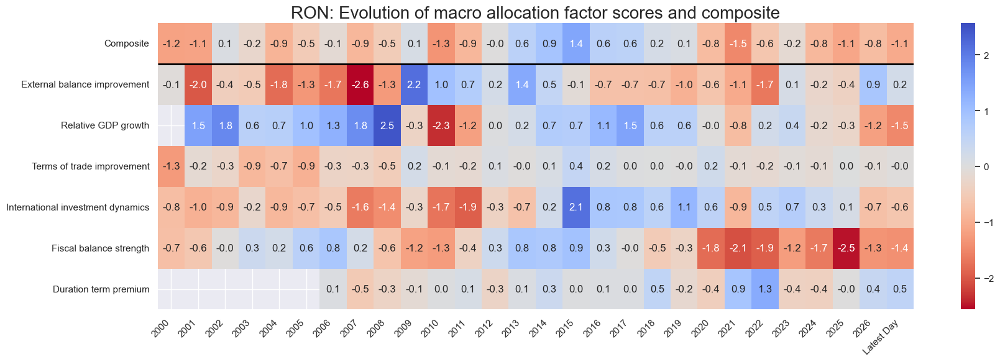

Latest day:  2022-01-31 00:00:00


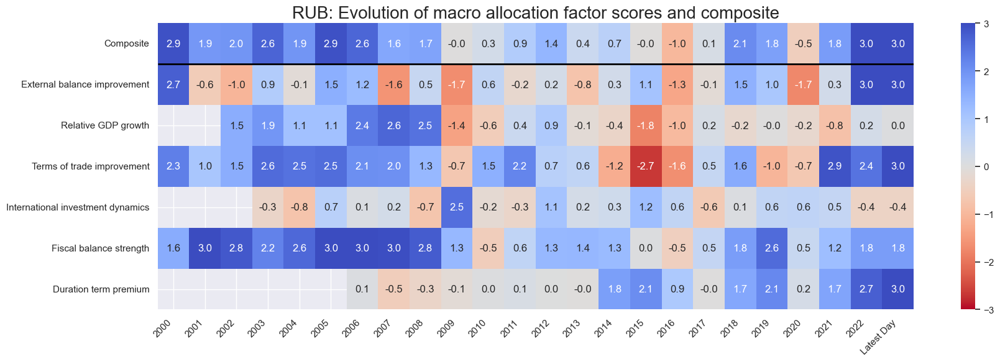

Latest day:  2026-06-12 00:00:00


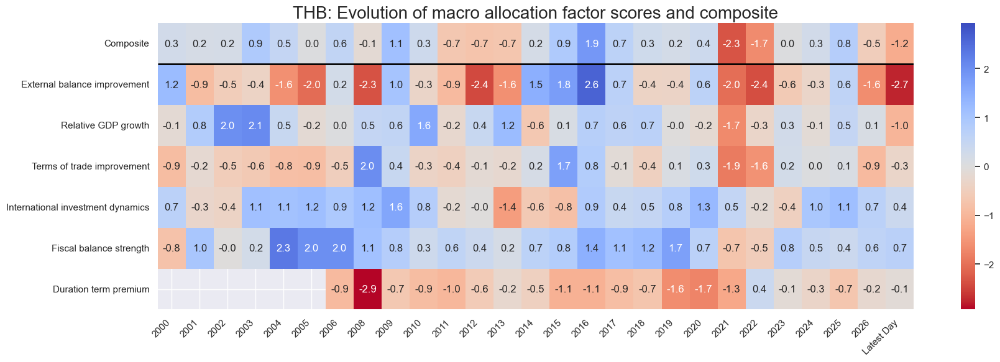

Latest day:  2026-06-12 00:00:00


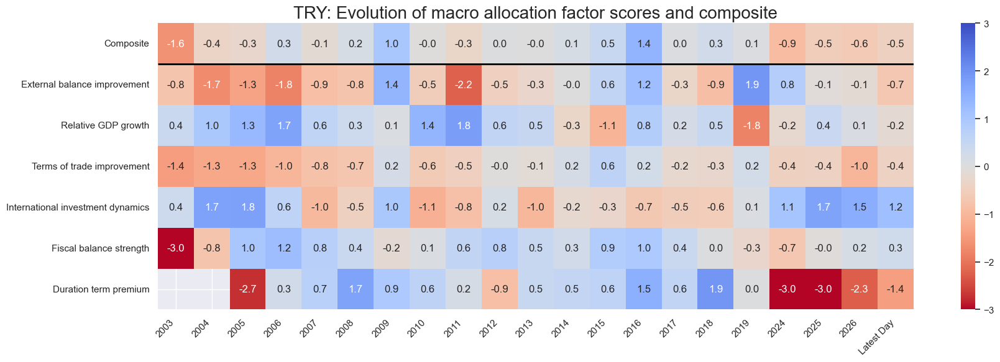

Latest day:  2026-06-12 00:00:00


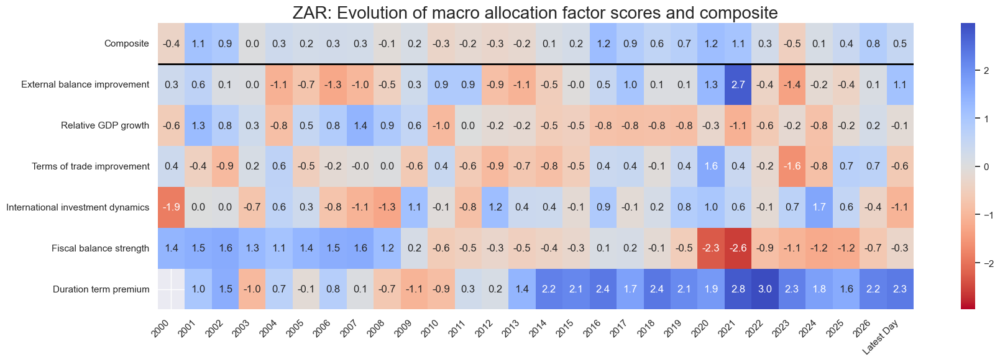

In [65]:
xcatx = list(concept_factors_zn.keys())
cidx = cids_em

for cid in cidx:

    sv.view_cid_evolution(
        cid=cid,
        xcats=xcatx,
        xcat_labels=concept_factors_zn,
        freq="A",
        transpose=False,
        title=f"{cid}: Evolution of macro allocation factor scores and composite",
        title_fontsize=20,
        figsize=(18, 6),
        round_decimals=1,
        start="2000-01-01",
    )

## Value checks

### Specs and panel test

In [66]:
dict_lm = {
    "sigs": list(concept_factors_zn.keys()),
    "targ": "LCBIXRUSD_VT10",
    "cidx": cids_em,
    "black": fxblack,
    "start": "2000-01-01",
    "srr": None,
    "pnls": None,
}

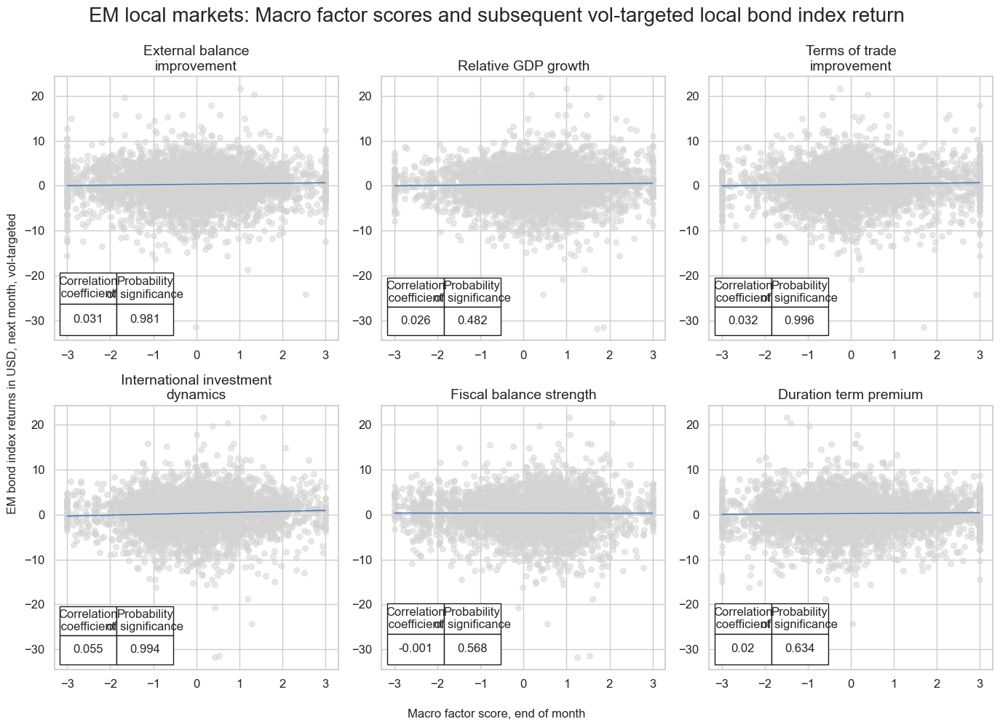

In [67]:
dix = dict_lm

sigs = [k for k in concept_factors_zn.keys() if k != 'COMP_ZN']
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

# Dictionary to store CategoryRelations objects
crx = []

# Create CategoryRelations objects for all signals
for sig in sigs:
    crx.append(
        msp.CategoryRelations(
        dfx,
        xcats=[sig, targ],
        cids=cidx,
        freq="M",
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
        blacklist=blax,
        xcat_trims=[None, None],
        )
    )

# Display scatter plots for all signals
msv.multiple_reg_scatter(
    cat_rels=crx,
    coef_box="lower left",
    ncol=3,
    nrow=2,
    xlab="Macro factor score, end of month",
    ylab="EM bond index returns in USD, next month, vol-targeted",
    title="EM local markets: Macro factor scores and subsequent vol-targeted local bond index return",
    title_fontsize=20,
    figsize=(14, 10),
    prob_est="map",
    subplot_titles=[concept_factors_zn[sig] for sig in sigs],
    share_axes=False,
)

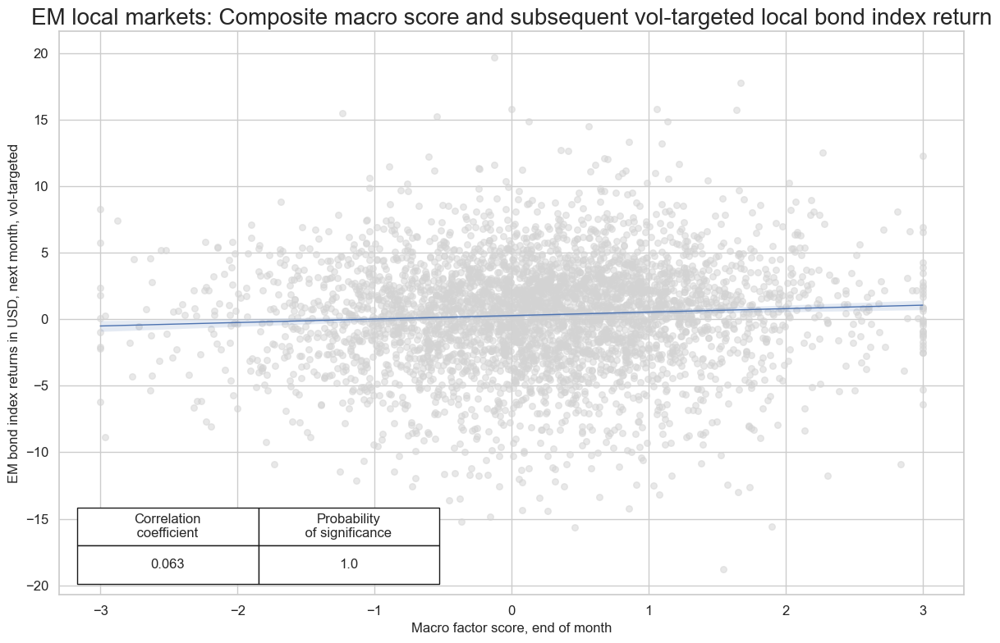

In [68]:
dix = dict_lm

sig = "COMP_ZN"
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

crx = msp.CategoryRelations(
    dfx,
    xcats=[sig, targ],
    cids=cidx,
    freq="m",
    lag=1,
    slip=1,
    xcat_aggs=["last", "sum"],
    start=start,
    blacklist=blax,
    xcat_trims=[20, 20],  # purely for better plot viewing, little impact on results
)

crx.reg_scatter(
    labels=False,
    coef_box="lower left",
    xlab="Macro factor score, end of month",
    ylab="EM bond index returns in USD, next month, vol-targeted",
    title="EM local markets: Composite macro score and subsequent vol-targeted local bond index return",
    title_fontsize=20,
    size=(12, 8),
    prob_est="map",
)

### Accuracy and correlation check

In [69]:
dix = dict_lm

sigs = dix["sigs"]
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=sigs,
    rets=targ,
    freqs="M",
    start=start,
    blacklist=blax,
)

dix["srr"] = srr

accuracy  bal_accuracy  pos_sigr  pos_retr  pos_prec  neg_prec  pearson  pearson_pval  kendall  kendall_pval    auc
Return         Signal   Frequency Aggregation                                                                                                                     
LCBIXRUSD_VT10 COMP_ZN  M         last            0.541         0.527     0.606     0.571     0.592     0.462    0.060         0.000    0.050         0.000  0.527
               DUTP_ZN  M         last            0.514         0.517     0.478     0.562     0.580     0.454    0.020         0.235    0.015         0.189  0.517
               IIPD_ZN  M         last            0.541         0.539     0.515     0.570     0.608     0.470    0.055         0.001    0.048         0.000  0.540
               RGDP_ZN  M         last            0.525         0.509     0.622     0.568     0.575     0.444    0.026         0.109    0.019         0.068  0.509
               TOT_ZN   M         last            0.517         0.519     0.488     0.571     0.590     0.448    0.032         0.040    0.026         0.013  0.519
               XBCH_ZN  M         last            0.524         0.524     0.504     0.571     0.594     0.453    0.031         0.048    0.024         0.025  0.524
               XGBAL_ZN M         last            0.530         0.510     0.649     0.571     0.578     0.442   -0.001         0.953    0.005         0.625  0.509

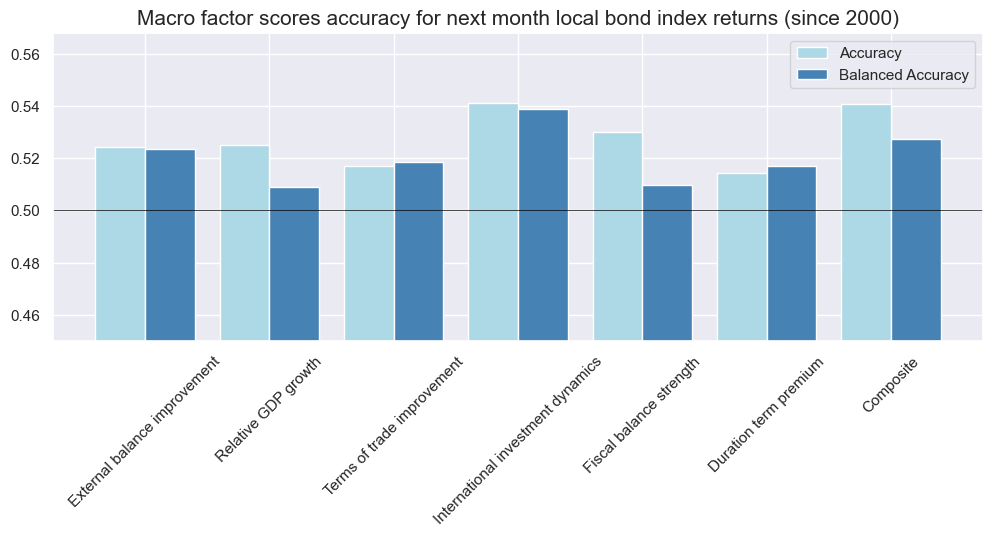

In [70]:
dix = dict_lm
srrx = dix["srr"]
display(srrx.multiple_relations_table().round(3))

srrx.accuracy_bars(type="signals", 
                  freq="m",
                  size=(12, 4),
                  title="Macro factor scores accuracy for next month local bond index returns (since 2000)",
                  title_fontsize=15,
                  x_labels=concept_factors_zn,
                  x_labels_rotate=45,
                  )

### Naive PnLs

In [71]:
dix = dict_lm

sig = "COMP_ZN"
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

pnls = msn.NaivePnL(
    df=dfx,
    ret=targ,
    sigs=[sig],
    cids=cidx,
    start=sdate,
    blacklist=fxblack,
    bms=["USD_GB10YXR_NSA", "EUR_FXXR_NSA", "USD_EQXR_NSA"],
)

pnls.make_pnl(
    sig=sig,
    sig_add=0,
    sig_op="raw", # "zn_score_pan",
    rebal_freq="monthly",
    neutral="zero",
    thresh=2,
    rebal_slip=1,
    vol_scale=10,
    pnl_name="PNL0",
)

pnls.make_pnl(
    sig=sig,
    sig_add=1,
    sig_op="zn_score_pan", # "zn_score_pan",
    rebal_freq="monthly",
    neutral="zero",
    thresh=1,
    rebal_slip=1,
    vol_scale=10,
    pnl_name="PNL1",
    winsorize_first=True,
)

pnls.make_long_pnl(vol_scale=10, label="Risk parity")
dix["pnls"] = pnls

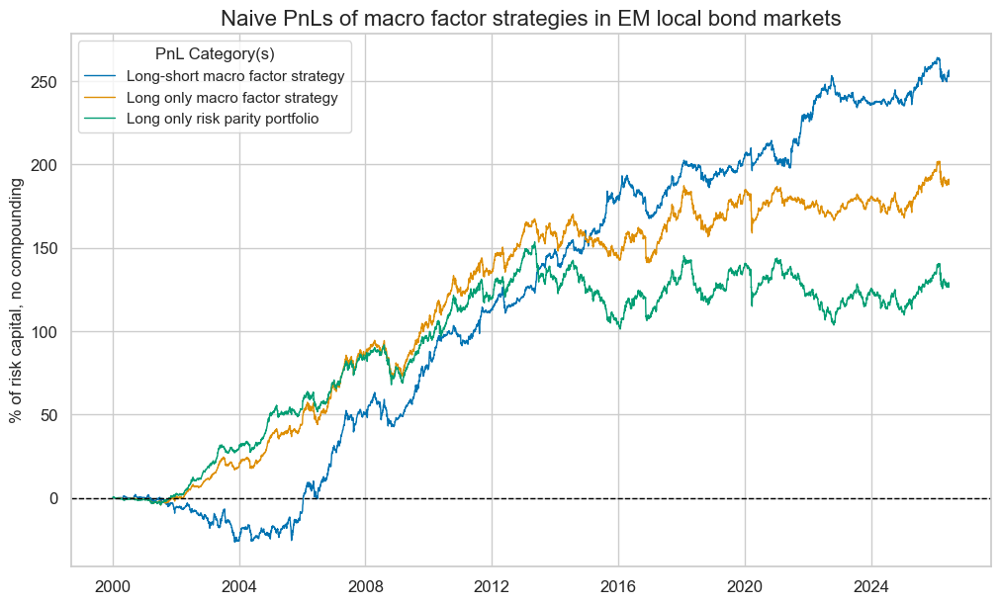

xcat,PNL0,PNL1,Risk parity
Return %,9.764147,7.274967,4.881583
St. Dev. %,10.0,10.0,10.0
Sharpe Ratio,0.976415,0.727497,0.488158
Sortino Ratio,1.426189,1.0232,0.67602
Max 21-Day Draw %,-15.547715,-22.590441,-22.364203
Max 6-Month Draw %,-18.435159,-24.130507,-24.8627
Peak to Trough Draw %,-28.535112,-30.619276,-52.366553
Top 5% Monthly PnL Share,0.532277,0.63472,0.911963
USD_GB10YXR_NSA correl,-0.017978,0.032444,0.045979
EUR_FXXR_NSA correl,0.134223,0.525337,0.573346


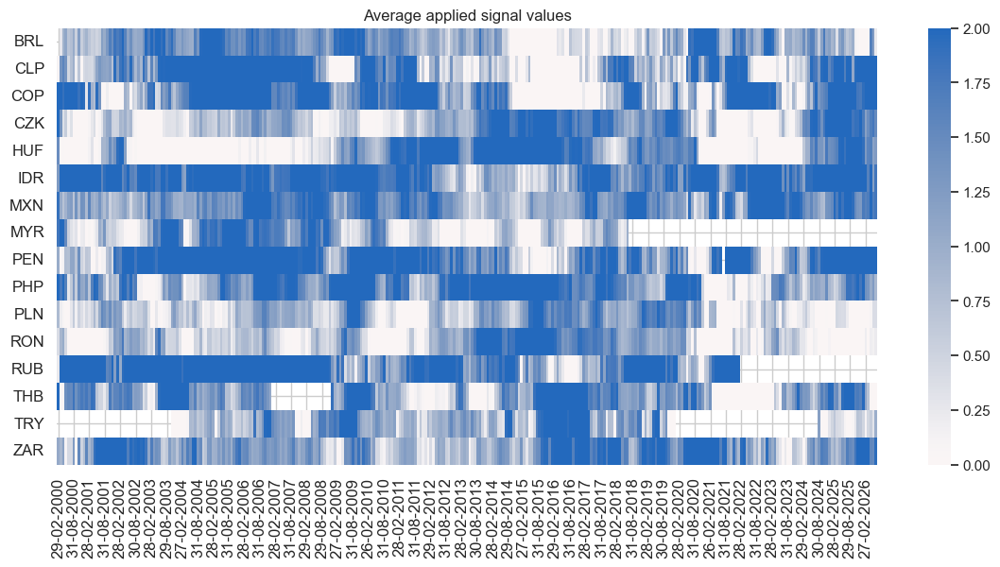

In [72]:
pnls = dix["pnls"]

pnl_labels = {
    "PNL0": "Long-short macro factor strategy",
    "PNL1": "Long only macro factor strategy",
    "Risk parity": "Long only risk parity portfolio",
}

pnls.plot_pnls(
    title="Naive PnLs of macro factor strategies in EM local bond markets",
    title_fontsize=16,
    figsize=(12, 7),
    xcat_labels=pnl_labels,
)
display(pnls.evaluate_pnls(["PNL0", "PNL1", "Risk parity"]))

pnls.signal_heatmap(
    pnl_name="PNL1",
    freq="M",
    title="Average applied signal values",
    title_fontsize=None,
    figsize=(14, 6)
)

In [73]:
cids_em

['BRL',
 'CLP',
 'COP',
 'CZK',
 'HUF',
 'IDR',
 'MXN',
 'MYR',
 'PEN',
 'PHP',
 'PLN',
 'RON',
 'RUB',
 'THB',
 'TRY',
 'ZAR']

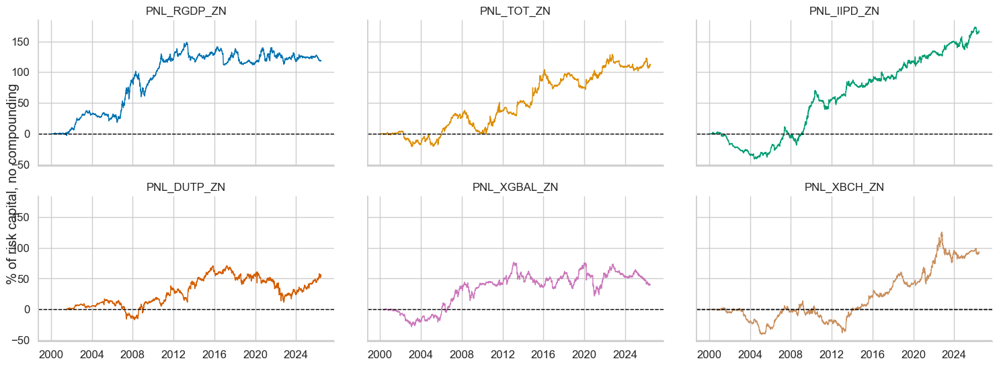

In [74]:
dix = dict_lm

sigs = sigs = list(set(dix["sigs"]) - set(["COMP_ZN"]))
ret = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

single_pnls = msn.NaivePnL(
    df=dfx,
    ret=targ,
    sigs=sigs,
    cids=cidx,
    start=start,
    blacklist=blax,
    bms=["USD_GB10YXR_NSA", "EUR_FXXR_NSA", "USD_EQXR_NSA"],
)

for sig in sigs:
    single_pnls.make_pnl(
        sig=sig,
        sig_op="raw",
        rebal_freq="monthly",
        neutral="zero",
        thresh=2,
        rebal_slip=1,
        vol_scale=10,
    )

single_pnls.plot_pnls(
    title=None,
    title_fontsize=18,
    xcat_labels=None,
    facet=True,
    figsize=(12, 10)
)